<a href="https://colab.research.google.com/github/karandoshi1810/Machine-Learning/blob/main/Regression(on_dataset).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

In [18]:
#To import datafiles from Google Drive
from google.colab import drive

In [19]:
#To mount the drive data into colab cloud and enter the activation code
#4/1AY0e-g4UIdh51GMQrW4voFdq4EfqV0GfhKX-Fbnk1cHN4l6ZVJCsaLaMybY
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [20]:
cd /content/drive/"My Drive/Colab Notebooks/Linear Regression"

/content/drive/My Drive/Colab Notebooks/Linear Regression


In [21]:
#columnname['x','y']
dataset=pd.read_csv("insurance.csv")
print(dataset)
dataset.shape


      age     sex     bmi  children smoker     region      charges
0      19  female  27.900         0    yes  southwest  16884.92400
1      18    male  33.770         1     no  southeast   1725.55230
2      28    male  33.000         3     no  southeast   4449.46200
3      33    male  22.705         0     no  northwest  21984.47061
4      32    male  28.880         0     no  northwest   3866.85520
...   ...     ...     ...       ...    ...        ...          ...
1333   50    male  30.970         3     no  northwest  10600.54830
1334   18  female  31.920         0     no  northeast   2205.98080
1335   18  female  36.850         0     no  southeast   1629.83350
1336   21  female  25.800         0     no  southwest   2007.94500
1337   61  female  29.070         0    yes  northwest  29141.36030

[1338 rows x 7 columns]


(1338, 7)

In [22]:

dataf = pd.DataFrame(dataset)#typecasting to dataframe
dataf.describe()#function to check the function of dataset
#converting categorical data to numerical data
sex_code = {'male':1, 'female':2}
dataf['sex'] = dataf['sex'].map(sex_code)
smoker_code = {'yes':1, 'no':0}
dataf['smoker'] = dataf['smoker'].map(smoker_code)
region_code = {'southwest':1, 'southeast':2,'northeast':3,'northwest':4}
dataf['region'] = dataf['region'].map(region_code)
print(dataf)

      age  sex     bmi  children  smoker  region      charges
0      19    2  27.900         0       1       1  16884.92400
1      18    1  33.770         1       0       2   1725.55230
2      28    1  33.000         3       0       2   4449.46200
3      33    1  22.705         0       0       4  21984.47061
4      32    1  28.880         0       0       4   3866.85520
...   ...  ...     ...       ...     ...     ...          ...
1333   50    1  30.970         3       0       4  10600.54830
1334   18    2  31.920         0       0       3   2205.98080
1335   18    2  36.850         0       0       2   1629.83350
1336   21    2  25.800         0       0       1   2007.94500
1337   61    2  29.070         0       1       4  29141.36030

[1338 rows x 7 columns]


In [38]:
age_value = dataf.iloc[0:dataf.shape[0],0:1]
print(age_value.shape)

gender_value = dataf.iloc[0:dataf.shape[0],1:2]
print(gender_value.shape)

bmi_value = dataf.iloc[0:dataf.shape[0],2:3]
print(bmi_value.shape)

children_value = dataf.iloc[0:dataf.shape[0],3:4]
print(children_value.shape)

smoker_value = dataf.iloc[0:dataf.shape[0],4:5]
print(smoker_value.shape)

region_value = dataf.iloc[0:dataf.shape[0],5:6]
print(region_value.shape)

charges_value = dataf.iloc[0:dataf.shape[0],6:7]
print(charges_value.shape)

(1338, 1)
(1338, 1)
(1338, 1)
(1338, 1)
(1338, 1)
(1338, 1)
(1338, 1)


Text(0.5, 1.0, 'Region vs Charges')

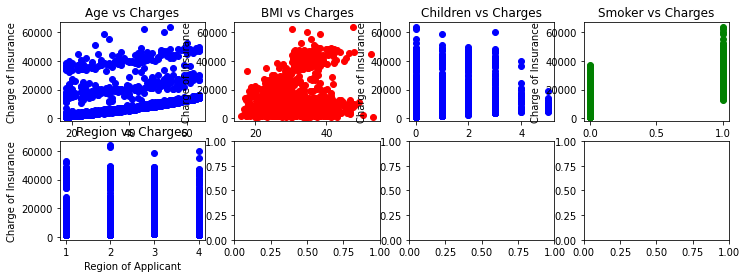

In [37]:
fig,axes = plt.subplots(figsize=(12,4),nrows=2,ncols=4)
axes[0][0].scatter(age_value,charges_value,color='b')
axes[0][0].set_xlabel("Age of Applicant")
axes[0][0].set_ylabel("Charge of Insurance")
axes[0][0].set_title("Age vs Charges")

axes[0][1].scatter(bmi_value,charges_value,color='r')
axes[0][1].set_xlabel("BMI of Applicant")
axes[0][1].set_ylabel("Charge of Insurance")
axes[0][1].set_title("BMI vs Charges")

axes[0][2].scatter(children_value,charges_value,color='b')
axes[0][2].set_xlabel("Children of Applicant")
axes[0][2].set_ylabel("Charge of Insurance")
axes[0][2].set_title("Children vs Charges")

axes[0][3].scatter(smoker_value,charges_value,color='g')
axes[0][3].set_xlabel("Smoker or Not")
axes[0][3].set_ylabel("Charge of Insurance")
axes[0][3].set_title("Smoker vs Charges")

axes[1][0].scatter(region_value,charges_value,color='b')
axes[1][0].set_xlabel("Region of Applicant")
axes[1][0].set_ylabel("Charge of Insurance")
axes[1][0].set_title("Region vs Charges")

#plt.tight_layout()

In [25]:
#feature Normalization
def feature_normalization(X):
    mean = np.mean(X,axis=0)
    std = np.std(X,axis=0)
    X_norm = (X-mean)/std
    return X_norm,mean,std

In [26]:
type(dataf)

pandas.core.frame.DataFrame

In [27]:
data = dataf.values       #dataFrames to array
print(data)
n = len(data[:,-1])
print(n)
X=data[:,0:7].reshape(n,7)
print(X)
X_norm,mean,std = feature_normalization(X)


[[1.90000000e+01 2.00000000e+00 2.79000000e+01 ... 1.00000000e+00
  1.00000000e+00 1.68849240e+04]
 [1.80000000e+01 1.00000000e+00 3.37700000e+01 ... 0.00000000e+00
  2.00000000e+00 1.72555230e+03]
 [2.80000000e+01 1.00000000e+00 3.30000000e+01 ... 0.00000000e+00
  2.00000000e+00 4.44946200e+03]
 ...
 [1.80000000e+01 2.00000000e+00 3.68500000e+01 ... 0.00000000e+00
  2.00000000e+00 1.62983350e+03]
 [2.10000000e+01 2.00000000e+00 2.58000000e+01 ... 0.00000000e+00
  1.00000000e+00 2.00794500e+03]
 [6.10000000e+01 2.00000000e+00 2.90700000e+01 ... 1.00000000e+00
  4.00000000e+00 2.91413603e+04]]
1338
[[1.90000000e+01 2.00000000e+00 2.79000000e+01 ... 1.00000000e+00
  1.00000000e+00 1.68849240e+04]
 [1.80000000e+01 1.00000000e+00 3.37700000e+01 ... 0.00000000e+00
  2.00000000e+00 1.72555230e+03]
 [2.80000000e+01 1.00000000e+00 3.30000000e+01 ... 0.00000000e+00
  2.00000000e+00 4.44946200e+03]
 ...
 [1.80000000e+01 2.00000000e+00 3.68500000e+01 ... 0.00000000e+00
  2.00000000e+00 1.62983350

In [28]:
#defining the Hypothesis    : H(x) = theta0 + theta1*x1 + theta2*x2 + theta3*x3 + theta4*x4

def hypothesis(theta_array,x1,x2,x3,x4,x5,x6):      #theta_array = [theta_array[0],theta_array[1],theta_array[2]]
    return theta_array[0]+(theta_array[1]*x1+theta_array[2]*x2 + theta_array[3]*x3 + theta_array[4]*x4 + theta_array[5]*x5 + theta_array[6]*x6)

In [29]:
def cost_function(theta_array,x1,x2,x3,x4,x5,x6,y,m):   #x and y are list of observation.
    total_error = 0     #accumulate all the error
    for i in range(m):
        total_error+=((theta_array[0]+theta_array[1]*x1[i]+theta_array[2]*x2[i]+theta_array[3]*x3+theta_array[4]*x4 + theta_array[5]*x5 + theta_array[6]*x6) - y[i])**2

    return total_error/(2*m)

In [30]:
def gradient_descent(theta_array,x1,x2,x3,x4,x5,x6,y,alpha,m):
    summation_theta0 = 0
    summation_theta1 = 0
    summation_theta2 = 0
    summation_theta3 = 0
    summation_theta4 = 0
    summation_theta5 = 0
    summation_theta6 = 0

    for i in range(m):
        summation_theta0+=((theta_array[0]+theta_array[1]*x1[i]+theta_array[2]*x2[i]+theta_array[3]*x3[i]+theta_array[4]*x4[i]+theta_array[5]*x5[i]+theta_array[6]*x6[i]) - y[i])
        print(summation_theta0)
        summation_theta1+=(((theta_array[0]+theta_array[1]*x1[i]+theta_array[2]*x2[i]+theta_array[3]*x3[i]+theta_array[4]*x4[i]+theta_array[5]*x5[i]+theta_array[6]*x6[i]) - y[i])*x1[i])
        summation_theta2+=(((theta_array[0]+theta_array[1]*x1[i]+theta_array[2]*x2[i]+theta_array[3]*x3[i]+theta_array[4]*x4[i]+theta_array[5]*x5[i]+theta_array[6]*x6[i]) - y[i])*x2[i])
        summation_theta3+=(((theta_array[0]+theta_array[1]*x1[i]+theta_array[2]*x2[i]+theta_array[3]*x3[i]+theta_array[4]*x4[i]+theta_array[5]*x5[i]+theta_array[6]*x6[i]) - y[i])*x3[i])
        summation_theta4+=(((theta_array[0]+theta_array[1]*x1[i]+theta_array[2]*x2[i]+theta_array[3]*x3[i]+theta_array[4]*x4[i]+theta_array[5]*x5[i]+theta_array[6]*x6[i]) - y[i])*x4[i])
        summation_theta5+=(((theta_array[0]+theta_array[1]*x1[i]+theta_array[2]*x2[i]+theta_array[3]*x3[i]+theta_array[4]*x4[i]+theta_array[5]*x5[i]+theta_array[6]*x6[i]) - y[i])*x5[i])
        summation_theta6+=(((theta_array[0]+theta_array[1]*x1[i]+theta_array[2]*x2[i]+theta_array[3]*x3[i]+theta_array[4]*x4[i]+theta_array[5]*x5[i]+theta_array[6]*x6[i]) - y[i])*x6[i])

    new_theta0 = theta_array[0]-alpha*(summation_theta0/m)
    new_theta1 = theta_array[1]-alpha*(summation_theta1/m)
    new_theta2 = theta_array[2]-alpha*(summation_theta2/m)
    new_theta3 = theta_array[3]-alpha*(summation_theta3/m)
    new_theta4 = theta_array[4]-alpha*(summation_theta4/m)
    new_theta5 = theta_array[5]-alpha*(summation_theta5/m)
    new_theta6 = theta_array[6]-alpha*(summation_theta6/m)

    updated_theta_array = [new_theta0,new_theta1,new_theta2,new_theta3,new_theta4,new_theta5,new_theta6]
    return updated_theta_array

In [31]:
def training(x1,x2,x3,x4,x5,x6,y,alpha,iters):
    theta_0 = 0
    theta_1 = 0
    theta_2 = 0
    theta_3 = 0
    theta_4 = 0
    theta_5 = 0
    theta_6 = 0
    theta_array = [theta_0,theta_1,theta_2,theta_3,theta_4,theta_5,theta_6]

    m=x1.size                #size of the data set or the number of observatio
    
    cost_function_values = []
    for i in range(iters):
        theta_array = gradient_descent(theta_array,x1,x2,x3,x4,x5,x6,y,alpha,m)     #taking the new theta's

        cost_function_values.append(cost_function(theta_array,x1,x2,x3,x4,x5,x6,y,m))   #taking all the cost function values and storing
        if(i%5==0):
            y_new=x6*theta_array[6]+x5*theta_array[5]+x4*theta_array[4]+x3*theta_array[3]+x2*theta_array[2]+x1*theta_array[1]+theta_array[0]       #linear regression line
            plt.plot(x1,y_new,'r')
            plt.scatter(x1,y)
            plt.show()

    x=np.arange(0,len(cost_function_values),step=1)
    plt.plot(x,cost_function_values,"-b")
    plt.xlabel("number of iteration")
    plt.ylabel("Cost/loss values")
    plt.title("cost Function curve")
    plt.show()

    return theta_array

[-0.2985838]
[0.65510537]
[1.38378004]
[0.66393706]
[1.44073924]
[2.2266475]
[2.6421478]
[3.13687533]
[3.70389199]
[2.41086534]
[3.28229688]
[2.08132865]
[3.02665049]
[3.20670973]
[1.03072624]
[1.97518946]
[2.17948413]
[3.07785794]
[3.29825698]
[1.35144983]
[1.35488425]
[2.10831844]
[3.11062535]
[1.09241174]
[1.67615709]
[1.61579507]
[1.51820188]
[1.60095693]
[2.46793831]
[0.36636388]
[-1.47702809]
[-0.56238217]
[0.14660432]
[0.10532752]
[-3.02747855]
[-2.06551887]
[-2.25896598]
[-1.35292031]
[-3.542329]
[-6.42556241]
[-5.58095682]
[-4.89361025]
[-4.31552973]
[-3.74085938]
[-3.14685173]
[-3.75482912]
[-2.93891254]
[-2.13650768]
[-2.08359567]
[-4.18501943]
[-3.27144252]
[-2.4709299]
[-3.32160624]
[-5.34318188]
[-4.91273707]
[-7.74005644]
[-7.76789064]
[-9.50534643]
[-10.32930085]
[-9.72784634]
[-9.34254952]
[-8.6184348]
[-10.01418193]
[-9.25941823]
[-9.37848174]
[-8.42625155]
[-8.50593854]
[-7.93751485]
[-7.33032578]
[-7.69319617]
[-7.96640763]
[-7.4318595]
[-7.30557821]
[-7.19622313]
[

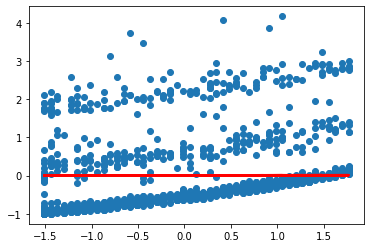

Streaming output truncated to the last 5000 lines.
[-18.18493035]
[-18.12125901]
[-18.20679748]
[-19.14980499]
[-18.78557995]
[-18.48630075]
[-17.54938786]
[-16.61154047]
[-16.34835715]
[-15.65311188]
[-15.68608617]
[-14.82381398]
[-14.01168314]
[-13.7282976]
[-13.74039593]
[-13.31731572]
[-12.89476892]
[-12.10011793]
[-12.1196617]
[-12.02548211]
[-11.56683492]
[-13.42233244]
[-12.45541767]
[-12.82912426]
[-13.49422445]
[-15.51693311]
[-15.77718645]
[-16.90809227]
[-17.03426829]
[-19.39526072]
[-20.01548199]
[-19.40381055]
[-19.00283366]
[-18.02473126]
[-17.90476043]
[-19.31523999]
[-18.5028773]
[-17.80214168]
[-17.5895962]
[-16.68480547]
[-16.33188001]
[-16.00552883]
[-15.69096488]
[-15.22897606]
[-14.83935063]
[-15.12871992]
[-15.26891703]
[-14.32182375]
[-14.00245851]
[-13.56664576]
[-13.68277927]
[-13.43467791]
[-12.6256244]
[-12.46863523]
[-11.73508375]
[-11.35445095]
[-10.81904138]
[-10.0696852]
[-9.13284515]
[-9.63048641]
[-9.71206642]
[-9.0480221]
[-8.14444429]
[-7.65929764]
[-

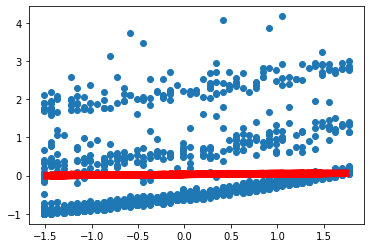

Streaming output truncated to the last 5000 lines.
[-17.27683051]
[-17.23214642]
[-17.35212099]
[-18.31180589]
[-17.93142027]
[-17.63762229]
[-16.71915187]
[-15.84284946]
[-15.58779251]
[-14.91329841]
[-14.91123243]
[-14.09563282]
[-13.33492569]
[-13.06367526]
[-13.07304789]
[-12.67600064]
[-12.26128976]
[-11.50044301]
[-11.53798595]
[-11.46369142]
[-11.0206532]
[-12.80598946]
[-11.87388229]
[-12.19952194]
[-12.79704123]
[-14.74618125]
[-14.99935412]
[-16.12236094]
[-16.20664573]
[-18.47748915]
[-19.09725441]
[-18.48944993]
[-18.11118687]
[-17.16682003]
[-17.039206]
[-18.46169585]
[-17.70075149]
[-17.03367398]
[-16.81349487]
[-15.94430702]
[-15.59825157]
[-15.27789549]
[-14.97350223]
[-14.54150244]
[-14.15831282]
[-14.48504799]
[-14.62127394]
[-13.70878725]
[-13.41709494]
[-12.96382294]
[-13.07648336]
[-12.82799052]
[-12.06210632]
[-11.89973117]
[-11.2069366]
[-10.85074049]
[-10.34264018]
[-9.61826582]
[-8.74269391]
[-9.18020848]
[-9.22209738]
[-8.58855574]
[-7.72411472]
[-7.2492675]
[

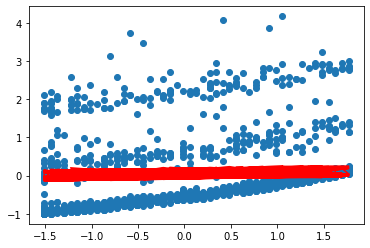

Streaming output truncated to the last 5000 lines.
[-16.41222871]
[-16.38572447]
[-16.53840134]
[-17.51413697]
[-17.11886098]
[-16.83036256]
[-15.92973854]
[-15.1116515]
[-14.86419849]
[-14.20970968]
[-14.17409877]
[-13.4027893]
[-12.69077558]
[-12.43087632]
[-12.43757955]
[-12.06496158]
[-11.65777885]
[-10.92924732]
[-10.983446]
[-10.92770431]
[-10.49935317]
[-12.21830018]
[-11.31946971]
[-11.59901398]
[-12.13205274]
[-14.01149953]
[-14.25774433]
[-15.3734519]
[-15.41753165]
[-17.60269856]
[-18.22221998]
[-17.61821853]
[-17.26156993]
[-16.34956455]
[-16.21467028]
[-17.6485599]
[-16.93605593]
[-16.3007711]
[-16.07363942]
[-15.23807407]
[-14.8986679]
[-14.58412819]
[-14.28928182]
[-13.88560822]
[-13.50866341]
[-13.87107344]
[-14.00377794]
[-13.12415402]
[-12.85856941]
[-12.38914331]
[-12.49822269]
[-12.24948339]
[-11.52472497]
[-11.35719878]
[-10.70291263]
[-10.36983253]
[-9.88782884]
[-9.1873857]
[-8.36983449]
[-8.74980439]
[-8.75356837]
[-8.14936858]
[-7.32187595]
[-6.85679352]
[-6.51

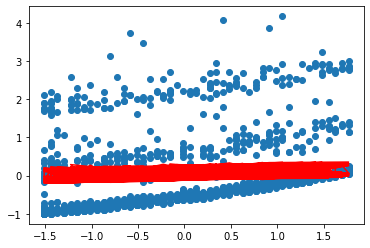

Streaming output truncated to the last 5000 lines.
[-15.58903163]
[-15.57993327]
[-15.76366559]
[-16.75484623]
[-16.34586115]
[-16.06248595]
[-15.17912473]
[-14.41610496]
[-14.17576532]
[-13.54055843]
[-13.47283606]
[-12.74355671]
[-12.07765254]
[-11.8283688]
[-11.83245975]
[-11.48276444]
[-11.082814]
[-10.38517429]
[-10.45477655]
[-10.4163404]
[-10.00180772]
[-11.65793366]
[-10.79091546]
[-11.02625932]
[-11.49777649]
[-13.3111994]
[-13.55067119]
[-14.65963829]
[-14.66513655]
[-16.76887608]
[-17.38834507]
[-16.7880776]
[-16.45199899]
[-15.57103383]
[-15.4292033]
[-16.87391472]
[-16.20704532]
[-15.60179164]
[-15.36833878]
[-14.56452533]
[-14.23155282]
[-13.92265384]
[-13.63676757]
[-13.2598513]
[-12.88896202]
[-13.28543233]
[-13.41502961]
[-12.56661216]
[-12.3256582]
[-11.84129352]
[-11.94670334]
[-11.6978495]
[-11.01227137]
[-10.83981792]
[-10.22191601]
[-9.91070263]
[-9.45363745]
[-8.77611801]
[-8.01351558]
[-8.33841532]
[-8.30556457]
[-7.7295865]
[-6.93697597]
[-6.48115057]
[-6.14351

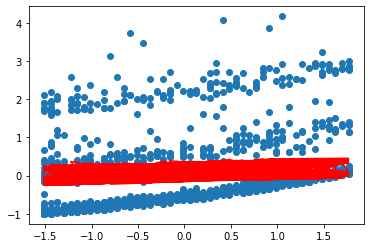

Streaming output truncated to the last 5000 lines.
[-14.80524713]
[-14.81281283]
[-15.02603634]
[-16.03207671]
[-15.61048075]
[-15.33205765]
[-14.46538841]
[-13.75445934]
[-13.5207725]
[-12.90414631]
[-12.8056865]
[-12.11629331]
[-11.49405335]
[-11.25469489]
[-11.25623128]
[-10.92804333]
[-10.53504072]
[-9.86693215]
[-9.95077126]
[-9.92847296]
[-9.52694035]
[-11.12362066]
[-10.28701397]
[-10.47997844]
[-10.89279798]
[-12.6436713]
[-12.87652716]
[-13.97927427]
[-13.94775387]
[-15.97410304]
[-16.59369183]
[-15.99708495]
[-15.68058393]
[-14.82938877]
[-14.68094807]
[-16.1359341]
[-15.51205558]
[-14.93516964]
[-14.69598061]
[-13.92215217]
[-13.59540288]
[-13.2919722]
[-13.01449405]
[-12.66285486]
[-12.29783396]
[-12.72682296]
[-12.8536942]
[-12.03491007]
[-11.81719296]
[-11.31902143]
[-11.42069095]
[-11.17184232]
[-10.5235922]
[-10.34642472]
[-9.76290027]
[-9.47237189]
[-9.03913912]
[-8.38357725]
[-7.67301756]
[-7.94521841]
[-7.87720869]
[-7.32837174]
[-6.56869229]
[-6.12164175]
[-5.785340

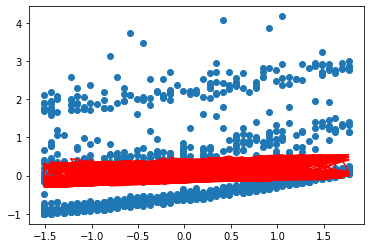

Streaming output truncated to the last 5000 lines.
[-14.05897945]
[-14.08249823]
[-14.32372714]
[-15.34406183]
[-14.91087563]
[-14.6372386]
[-13.78670352]
[-13.1250507]
[-12.89758434]
[-12.29885939]
[-12.17097904]
[-11.51943813]
[-10.93854808]
[-10.70846734]
[-10.70750734]
[-10.39949723]
[-10.013169]
[-9.37329086]
[-9.47027993]
[-9.46302656]
[-9.07372299]
[-10.6141508]
[-9.80661578]
[-9.9589506]
[-10.31576754]
[-12.00738101]
[-12.23377942]
[-13.33079118]
[-13.2637562]
[-15.21655053]
[-15.8364137]
[-15.24339037]
[-14.94552392]
[-14.12287778]
[-13.96813615]
[-15.43287863]
[-14.84950014]
[-14.29941108]
[-14.05502766]
[-13.30951529]
[-12.98878393]
[-12.69065247]
[-12.42106329]
[-12.09330447]
[-11.73396722]
[-12.194003]
[-12.31849866]
[-11.5278537]
[-11.33205818]
[-10.82113327]
[-10.91900797]
[-10.67027297]
[-10.05758733]
[-9.87590901]
[-9.32486618]
[-9.05390495]
[-8.64344815]
[-8.00891745]
[-7.34765119]
[-7.56942531]
[-7.46765954]
[-6.94492141]
[-6.21633091]
[-5.77759738]
[-5.44273577]
[-5

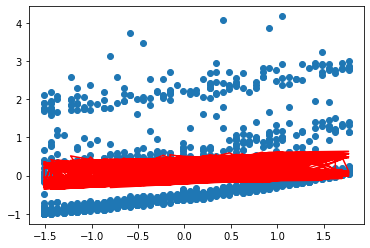

Streaming output truncated to the last 5000 lines.
[-13.34842444]
[-13.38721494]
[-13.65503798]
[-14.68912101]
[-14.24529273]
[-13.97628071]
[-13.1413352]
[-12.52629741]
[-12.30464576]
[-11.72316394]
[-11.56712511]
[-10.951507]
[-10.40977648]
[-10.18836604]
[-10.18496803]
[-9.89588697]
[-9.51597024]
[-8.90307908]
[-9.01220597]
[-9.01897471]
[-8.64117381]
[-10.12836986]
[-9.348625]
[-9.46201113]
[-9.76539743]
[-11.40086611]
[-11.62096641]
[-12.71269393]
[-12.61159159]
[-14.49447528]
[-15.11475108]
[-14.52523125]
[-14.24510321]
[-13.44983263]
[-13.2890834]
[-14.76309162]
[-14.21786626]
[-13.69309066]
[-13.44401426]
[-12.72524157]
[-12.41032803]
[-12.11733014]
[-11.85514169]
[-11.54994524]
[-11.19610968]
[-11.68578688]
[-11.80822884]
[-11.04430394]
[-10.8691889]
[-10.34649092]
[-10.44053104]
[-10.19200761]
[-9.6132073]
[-9.42721185]
[-8.90685957]
[-8.65440809]
[-8.2657182]
[-7.65133044]
[-7.03675645]
[-7.21028079]
[-7.07611064]
[-6.57846618]
[-5.87922529]
[-5.44837407]
[-5.11504493]
[-5.2

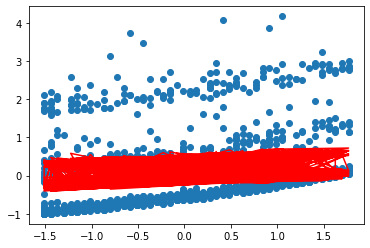

Streaming output truncated to the last 5000 lines.
[-12.67186515]
[-12.72527441]
[-13.01835116]
[-14.0656554]
[-13.61206559]
[-13.34752236]
[-12.52763515]
[-11.95669597]
[-11.74047825]
[-11.17560239]
[-10.99261451]
[-10.41108868]
[-9.90644454]
[-9.69313471]
[-9.68735721]
[-9.41603223]
[-9.04227428]
[-8.45518145]
[-8.57550384]
[-8.59533762]
[-8.22835518]
[-9.66517714]
[-8.91199675]
[-8.98804886]
[-9.240459]
[-10.82273261]
[-11.0366945]
[-12.1235576]
[-11.98978009]
[-13.8062156]
[-14.42702726]
[-13.84092847]
[-13.57768712]
[-12.80866446]
[-12.64218596]
[-14.12499512]
[-13.61571168]
[-13.11484864]
[-12.86154304]
[-12.16802102]
[-11.85873037]
[-11.57070388]
[-11.31545703]
[-11.03157923]
[-10.68306636]
[-11.20104314]
[-11.32172674]
[-10.58317406]
[-10.42756838]
[-9.89400934]
[-9.98418855]
[-9.73596489]
[-9.18945106]
[-8.9993232]
[-8.50796936]
[-8.2730274]
[-7.90514059]
[-7.31004419]
[-6.73970132]
[-6.86706146]
[-6.70178885]
[-6.22826895]
[-5.55673536]
[-5.13335377]
[-4.80163679]
[-4.8580837

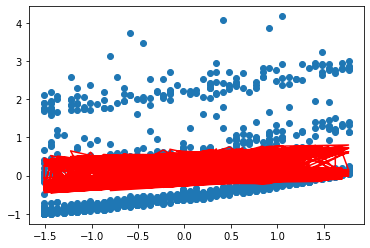

Streaming output truncated to the last 5000 lines.
[-12.02766757]
[-12.09506992]
[-12.41212722]
[-13.47214392]
[-13.00960998]
[-12.74938406]
[-11.94403727]
[-11.41481719]
[-11.20367612]
[-10.65478956]
[-10.44601147]
[-9.8968413]
[-9.42732131]
[-9.22157784]
[-9.21347931]
[-8.95880876]
[-8.59096666]
[-8.02853582]
[-8.15917673]
[-8.19118018]
[-7.83437168]
[-9.22352302]
[-8.49573484]
[-8.53600371]
[-8.73977999]
[-10.27165179]
[-10.47963487]
[-11.56202407]
[-11.39691041]
[-13.15018757]
[-13.77164451]
[-13.18888239]
[-12.94171816]
[-12.19786001]
[-12.0259164]
[-13.5170862]
[-13.04166131]
[-12.56338782]
[-12.30628169]
[-11.63660394]
[-11.33274637]
[-11.0495327]
[-10.80079573]
[-10.53706282]
[-10.19369686]
[-10.73869206]
[-10.85788794]
[-10.14342738]
[-10.00622599]
[-9.46265409]
[-9.5489582]
[-9.30111352]
[-8.78536372]
[-8.59127964]
[-8.1273256]
[-7.90894704]
[-7.56094263]
[-6.98432118]
[-6.45588064]
[-6.53907445]
[-6.3439531]
[-5.89362352]
[-5.24824659]
[-4.83194289]
[-4.5019054]
[-4.51613739

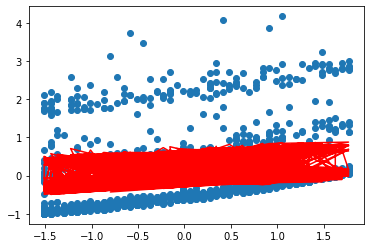

Streaming output truncated to the last 5000 lines.
[-11.41427664]
[-11.49507257]
[-11.83490119]
[-12.90713942]
[-12.43641984]
[-12.18036435]
[-11.38905356]
[-10.89930245]
[-10.69290285]
[-10.159409]
[-9.92595101]
[-9.40748892]
[-8.97123573]
[-8.77255772]
[-8.76219645]
[-8.5231457]
[-8.16098591]
[-7.62213078]
[-7.76227427]
[-7.80560985]
[-7.45836823]
[-8.80240658]
[-8.09888949]
[-8.10486432]
[-8.26224195]
[-9.74635708]
[-9.9485205]
[-11.02679895]
[-10.83163673]
[-12.52488146]
[-13.14708037]
[-12.56756911]
[-12.33571246]
[-11.61597799]
[-11.43882009]
[-12.93793336]
[-12.49440408]
[-12.03747072]
[-11.77696003]
[-11.12979812]
[-10.83118894]
[-10.55263311]
[-10.31000013]
[-10.06530434]
[-9.72691289]
[-10.29770328]
[-10.41565917]
[-9.72407493]
[-9.60423511]
[-9.05143896]
[-9.13386483]
[-8.88646995]
[-8.40003446]
[-8.20216223]
[-7.7640977]
[-7.56138755]
[-7.23238605]
[-6.67345694]
[-6.184715]
[-6.22565619]
[-6.00189311]
[-5.57385343]
[-4.95316904]
[-4.54357139]
[-4.2152695]
[-4.18927269]
[-4.

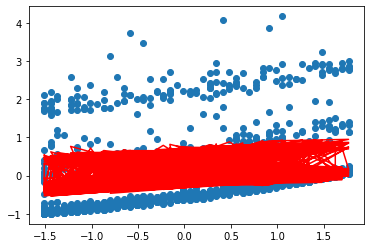

Streaming output truncated to the last 5000 lines.
[-10.83021236]
[-10.92382749]
[-11.28527889]
[-12.36926512]
[-11.89106339]
[-11.63903595]
[-10.86127018]
[-10.40886021]
[-10.20688768]
[-9.68820954]
[-9.4311354]
[-8.94181824]
[-8.53707376]
[-8.3449916]
[-8.33242561]
[-8.10802304]
[-7.75132107]
[-7.23500318]
[-7.38389038]
[-7.43777478]
[-7.0995283]
[-8.40087334]
[-7.72055517]
[-7.69366583]
[-7.80677781]
[-9.24564124]
[-9.44214327]
[-10.51664858]
[-10.2926757]
[-11.92885818]
[-12.55188406]
[-11.97553688]
[-11.75825621]
[-11.06164568]
[-10.87951168]
[-12.38617313]
[-11.97269005]
[-11.5359168]
[-11.27236704]
[-10.64646622]
[-10.35292582]
[-10.07887647]
[-9.84196591]
[-9.61526169]
[-9.28167591]
[-9.87709355]
[-9.99403589]
[-9.32417331]
[-9.22071115]
[-8.65942373]
[-8.73797817]
[-8.49109619]
[-8.03259445]
[-7.83109449]
[-7.41749257]
[-7.22960424]
[-6.91876549]
[-6.37677854]
[-5.92564975]
[-5.92617124]
[-5.6749282]
[-5.26831072]
[-4.67093648]
[-4.26769197]
[-3.94117148]
[-3.87683842]
[-3.797

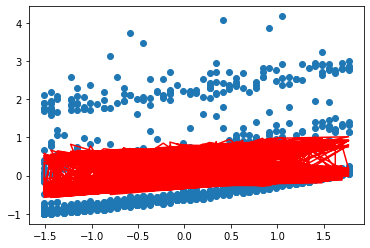

Streaming output truncated to the last 5000 lines.
[-10.27406619]
[-10.37995024]
[-10.76193358]
[-11.85721108]
[-11.37217943]
[-11.12404205]
[-10.3593437]
[-9.94226264]
[-9.74442234]
[-9.24000208]
[-8.96033082]
[-8.49867552]
[-8.12377553]
[-7.93784906]
[-7.92313598]
[-7.71246917]
[-7.36100924]
[-6.86623584]
[-7.02316118]
[-7.08686198]
[-6.75707219]
[-8.01801313]
[-7.35986854]
[-7.30148778]
[-7.37236951]
[-8.76835352]
[-8.95935128]
[-10.03039714]
[-9.77880355]
[-11.36074606]
[-11.98467317]
[-11.41140264]
[-11.20800242]
[-10.53355565]
[-10.34667184]
[-11.86050683]
[-11.47532747]
[-11.05759991]
[-10.79134816]
[-10.18552328]
[-9.89687706]
[-9.62718649]
[-9.39563968]
[-9.18594015]
[-8.85699484]
[-9.47592462]
[-9.59206013]
[-8.94282254]
[-8.85480971]
[-8.28571206]
[-8.36041083]
[-8.11409772]
[-7.68221499]
[-7.4772404]
[-7.08675302]
[-6.91288571]
[-6.61940708]
[-6.09364324]
[-5.67815391]
[-5.64001113]
[-5.36240612]
[-4.97637483]
[-4.40100547]
[-4.0037792]
[-3.6790766]
[-3.57821058]
[-3.487575

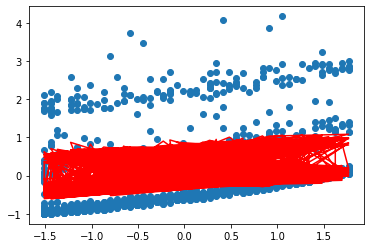

Streaming output truncated to the last 5000 lines.
[-9.74449759]
[-9.86212337]
[-10.26360261]
[-11.36973101]
[-10.87847383]
[-10.6340928]
[-9.88199759]
[-9.49834249]
[-9.30435796]
[-8.81365644]
[-8.51236417]
[-8.07696362]
[-7.73033273]
[-7.55014943]
[-7.53334641]
[-7.33555863]
[-6.9891333]
[-6.51495535]
[-6.6792631]
[-6.75209553]
[-6.43025536]
[-7.65295803]
[-7.01600651]
[-6.92745204]
[-6.95804579]
[-8.31339706]
[-8.49904621]
[-9.566924]
[-9.28885331]
[-10.81923762]
[-11.44413039]
[-10.87384883]
[-10.68366768]
[-10.03046266]
[-9.83904405]
[-11.3596975]
[-11.00118016]
[-10.60144573]
[-10.33280265]
[-9.74593431]
[-9.46201262]
[-9.19653681]
[-8.97001663]
[-8.77639023]
[-8.45192398]
[-9.0933012]
[-9.20881825]
[-8.57916418]
[-8.50572472]
[-7.9294494]
[-8.00031631]
[-7.75462143]
[-7.34810565]
[-7.13980261]
[-6.77115612]
[-6.61055233]
[-6.33366702]
[-5.82343712]
[-5.44171926]
[-5.36659327]
[-5.06370191]
[-4.69745145]
[-4.14285456]
[-3.75132874]
[-3.42847199]
[-3.29279131]
[-3.19168407]
[-3.63

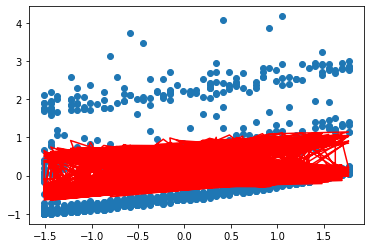

Streaming output truncated to the last 5000 lines.
[-9.24023068]
[-9.36909319]
[-9.78908433]
[-10.90563914]
[-10.40871622]
[-10.16796198]
[-9.42801885]
[-9.07599007]
[-8.88560211]
[-8.40809842]
[-8.08612009]
[-7.67563922]
[-7.35578609]
[-7.18095942]
[-7.16212304]
[-6.97640985]
[-6.63481976]
[-6.18032997]
[-6.35141091]
[-6.43273491]
[-6.1183669]
[-7.3048804]
[-6.68818431]
[-6.57072091]
[-6.56288]
[-7.87972633]
[-8.06018081]
[-9.12516109]
[-8.8217122]
[-10.30308663]
[-10.92900047]
[-10.36162022]
[-10.18402925]
[-9.55118066]
[-9.35543165]
[-10.88256693]
[-10.54916487]
[-10.16642948]
[-9.89568108]
[-9.326712]
[-9.04735008]
[-8.78594865]
[-8.5641383]
[-8.38570563]
[-8.06556086]
[-8.72836899]
[-8.84343899]
[-8.23237929]
[-8.17268673]
[-7.58982108]
[-7.65688716]
[-7.41185376]
[-7.02951246]
[-6.81802057]
[-6.47001167]
[-6.32195486]
[-6.06093029]
[-5.56557381]
[-5.21585935]
[-5.1053599]
[-4.77821682]
[-4.4309715]
[-3.89598346]
[-3.50985655]
[-3.18886593]
[-3.02000787]
[-2.90911622]
[-3.29729922

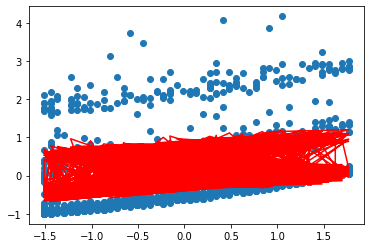

Streaming output truncated to the last 5000 lines.
[-8.76005112]
[-8.89966664]
[-9.33723513]
[-10.46380722]
[-9.96173679]
[-9.72448385]
[-8.99625482]
[-8.67415036]
[-8.48711603]
[-8.02230703]
[-7.68053811]
[-7.29371017]
[-6.99922295]
[-6.82939076]
[-6.80857697]
[-6.6341831]
[-6.29723662]
[-5.86156763]
[-6.038856]
[-6.12807341]
[-5.82072798]
[-6.97299103]
[-6.37565379]
[-6.23049524]
[-6.18598813]
[-7.46634477]
[-7.6417566]
[-8.70409045]
[-8.37631911]
[-9.81110523]
[-10.43808727]
[-9.87352098]
[-9.70792211]
[-9.09458003]
[-8.89469496]
[-10.42799289]
[-10.11824884]
[-9.75157357]
[-9.47898297]
[-8.92691452]
[-8.65195244]
[-8.39448867]
[-8.17709043]
[-8.0130213]
[-7.69704436]
[-8.38031284]
[-8.49509144]
[-7.90168675]
[-7.85496129]
[-7.26605043]
[-7.32935312]
[-7.08501883]
[-6.7257163]
[-6.51116892]
[-6.18266072]
[-6.04647309]
[-5.80060933]
[-5.3194933]
[-5.00010864]
[-4.85577707]
[-4.5053773]
[-4.17639008]
[-3.65991223]
[-3.27889814]
[-2.95978693]
[-2.75931162]
[-2.63927928]
[-2.97953619]
[

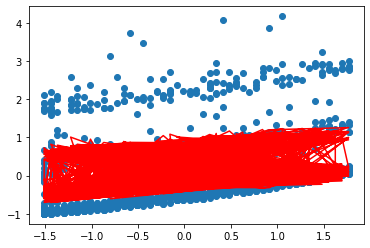

Streaming output truncated to the last 5000 lines.
[-8.30280315]
[-8.45270836]
[-8.90696662]
[-10.04316179]
[-9.53642332]
[-9.30255011]
[-8.58561017]
[-8.29182035]
[-8.10791196]
[-7.6553118]
[-7.29460987]
[-6.93023292]
[-6.65977499]
[-6.49459805]
[-6.4718621]
[-6.30807849]
[-5.97559143]
[-5.55791405]
[-5.74088467]
[-5.83743658]
[-5.53669046]
[-6.65653736]
[-6.07770166]
[-5.90601266]
[-5.8265268]
[-7.07230247]
[-7.24282153]
[-8.30274188]
[-7.95166222]
[-9.34216116]
[-9.97025101]
[-9.40841188]
[-9.25423629]
[-8.65958482]
[-8.45574852]
[-9.99490647]
[-9.70744746]
[-9.35594549]
[-9.08175448]
[-8.54564346]
[-8.27492604]
[-8.02126684]
[-7.80800101]
[-7.6575116]
[-7.34555279]
[-8.04835493]
[-8.16298324]
[-7.58634144]
[-7.55184733]
[-6.95739703]
[-7.01697947]
[-6.77337675]
[-6.43603129]
[-6.21855581]
[-5.90847419]
[-5.78351461]
[-5.5521429]
[-5.08466076]
[-4.7940216]
[-4.61733363]
[-4.24463391]
[-3.93318552]
[-3.43418051]
[-3.05800787]
[-2.74078303]
[-2.51017706]
[-2.3816069]
[-2.67608815]
[-4

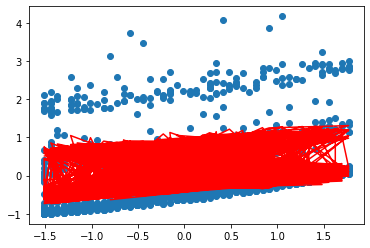

Streaming output truncated to the last 5000 lines.
[-7.86738674]
[-8.02713786]
[-8.49724295]
[-9.64268141]
[-9.13171829]
[-8.90110712]
[-8.195044]
[-7.92804641]
[-7.74705063]
[-7.30619028]
[-6.92737657]
[-6.58431015]
[-6.33661607]
[-6.1757767]
[-6.15117306]
[-5.99733406]
[-5.6691294]
[-5.26865092]
[-5.45681648]
[-5.56018078]
[-5.26563549]
[-6.35480176]
[-5.79364786]
[-5.59654594]
[-5.48369143]
[-6.696694]
[-6.86246786]
[-7.92019068]
[-7.54677669]
[-8.89517522]
[-9.52440558]
[-8.96520757]
[-8.82191421]
[-8.24517028]
[-8.03755859]
[-9.58228951]
[-9.315822]
[-8.97865573]
[-8.70308628]
[-8.18204184]
[-7.91541855]
[-7.66543444]
[-7.45603823]
[-7.3183885]
[-7.01030209]
[-7.73175314]
[-7.84635876]
[-7.28563262]
[-7.2626757]
[-6.663155]
[-6.71906536]
[-6.47622192]
[-6.15980321]
[-5.93952138]
[-5.64685152]
[-5.5325135]
[-5.31499488]
[-4.86056537]
[-4.59717192]
[-4.38954037]
[-3.99546045]
[-3.70085838]
[-3.2183468]
[-2.84675817]
[-2.53142098]
[-2.27210091]
[-2.13555747]
[-2.38631778]
[-3.9533442

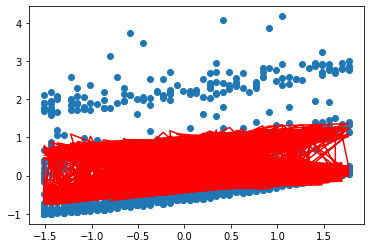

Streaming output truncated to the last 5000 lines.
[-7.45275485]
[-7.62192689]
[-8.10707824]
[-9.26139422]
[-8.74661619]
[-8.51915308]
[-7.82356712]
[-7.58192185]
[-7.40363882]
[-6.97406565]
[-6.57792656]
[-6.25508849]
[-6.02896018]
[-5.87216088]
[-5.84574321]
[-5.70122399]
[-5.37713158]
[-4.99309419]
[-5.18600272]
[-5.29569178]
[-5.00697218]
[-6.06709995]
[-5.52284405]
[-5.30140131]
[-5.15671447]
[-6.33865633]
[-6.4998301]
[-7.55555555]
[-7.16074255]
[-8.46911874]
[-9.09951605]
[-8.54287408]
[-8.40994828]
[-7.85036033]
[-7.63914058]
[-9.18917221]
[-8.94247753]
[-8.61885577]
[-8.34211145]
[-7.83529217]
[-7.57261709]
[-7.32618215]
[-7.12040873]
[-6.99489989]
[-6.69054415]
[-7.42979936]
[-7.54449742]
[-6.99888235]
[-6.98680769]
[-6.38265141]
[-6.43494231]
[-6.19288144]
[-5.8964081]
[-5.6734363]
[-5.39721936]
[-5.29292923]
[-5.08865316]
[-4.64671935]
[-4.40915167]
[-4.17192902]
[-3.75735294]
[-3.47893061]
[-3.0119877]
[-2.64473892]
[-2.33128554]
[-2.04460117]
[-1.90061307]
[-2.10961568]
[

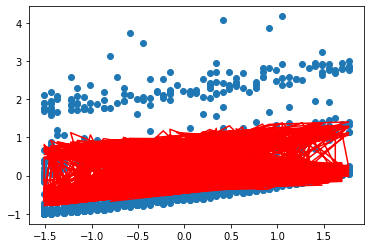

Streaming output truncated to the last 5000 lines.
[-7.05791091]
[-7.23609688]
[-7.73553417]
[-8.89837543]
[-8.38016093]
[-8.15573557]
[-7.47023947]
[-7.25258461]
[-7.07682716]
[-6.65810443]
[-6.24539292]
[-5.94175634]
[-5.73605943]
[-5.5830217]
[-5.55484281]
[-5.41905687]
[-5.0989132]
[-4.73059241]
[-4.92782494]
[-5.04338341]
[-4.76013641]
[-5.79277942]
[-5.26467213]
[-5.01991699]
[-4.84486368]
[-5.99736684]
[-6.15408304]
[-7.20799652]
[-6.79268253]
[-8.06301124]
[-8.69459621]
[-8.14042632]
[-8.01737846]
[-7.47422531]
[-7.25955678]
[-8.81463083]
[-8.58656082]
[-8.27573627]
[-7.9980035]
[-7.5046147]
[-7.24574639]
[-7.00273824]
[-6.80035577]
[-6.68632797]
[-6.38556514]
[-7.141818]
[-7.25671207]
[-6.72544398]
[-6.72363369]
[-6.11524472]
[-6.16397262]
[-5.92271362]
[-5.64525085]
[-5.41970034]
[-5.1590304]
[-5.0642455]
[-4.87262857]
[-4.44265685]
[-4.22957055]
[-3.96405146]
[-3.52982877]
[-3.26694461]
[-2.81469725]
[-2.45155677]
[-2.13997877]
[-1.82721632]
[-1.67627846]
[-1.84539915]
[-3.3

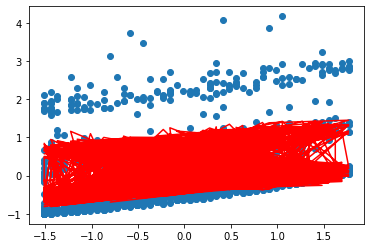

Streaming output truncated to the last 5000 lines.
[-6.68190639]
[-6.86871651]
[-7.38171769]
[-8.5527451]
[-8.03144342]
[-7.809949]
[-7.13416765]
[-6.93921504]
[-6.76580787]
[-6.35751433]
[-5.92895131]
[-5.64354183]
[-5.45720226]
[-5.30766543]
[-5.2777772]
[-5.15017407]
[-4.83382199]
[-4.48052519]
[-4.68169352]
[-4.80269632]
[-4.52458956]
[-5.53121797]
[-5.01854279]
[-4.7514617]
[-4.54744053]
[-5.67204142]
[-5.82443989]
[-6.87671303]
[-6.44176015]
[-7.67591817]
[-8.30870632]
[-7.75692581]
[-7.64329006]
[-7.11587973]
[-6.89791408]
[-8.45778549]
[-8.24725843]
[-7.9485252]
[-7.66997451]
[-7.18926564]
[-6.93406706]
[-6.69436682]
[-6.49515757]
[-6.39198768]
[-6.09468398]
[-6.86716444]
[-6.98234746]
[-6.46470074]
[-6.47257184]
[-5.86032335]
[-5.90554807]
[-5.66510654]
[-5.40576385]
[-5.17774101]
[-4.93176215]
[-4.84596917]
[-4.66645391]
[-4.24793303]
[-4.05805517]
[-3.76547885]
[-3.31242582]
[-3.06446242]
[-2.62608626]
[-2.26683448]
[-1.95711932]
[-1.61950441]
[-1.46208011]
[-1.59311107]
[-3

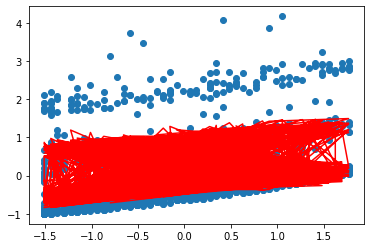

Streaming output truncated to the last 5000 lines.
[-6.32383839]
[-6.51889946]
[-7.0447788]
[-8.22366588]
[-7.69959918]
[-7.48093238]
[-6.8145026]
[-6.64103378]
[-6.46981281]
[-6.07154218]
[-5.62781785]
[-5.35971083]
[-5.19171161]
[-5.04543171]
[-5.01388512]
[-4.89394817]
[-4.58123667]
[-4.24230173]
[-4.44704633]
[-4.5730967]
[-4.29981741]
[-5.28182231]
[-4.78389423]
[-4.49543323]
[-4.26377865]
[-5.3619327]
[-5.51015048]
[-6.56094209]
[-6.10717779]
[-7.30694876]
[-7.9409509]
[-7.39147846]
[-7.28681158]
[-6.7744802]
[-6.55336186]
[-8.11779806]
[-7.92379487]
[-7.63648619]
[-7.35727334]
[-6.88853552]
[-6.63687396]
[-6.40036617]
[-6.20412571]
[-6.11122524]
[-5.81725084]
[-6.60522369]
[-6.72077875]
[-6.2160643]
[-6.23306684]
[-5.61730427]
[-5.65908847]
[-5.41947663]
[-5.17740575]
[-4.94701235]
[-4.71491584]
[-4.63762924]
[-4.46968292]
[-4.06212309]
[-3.89424831]
[-3.57580081]
[-3.10470161]
[-2.87106491]
[-2.44578163]
[-2.09021032]
[-1.78234182]
[-1.42104236]
[-1.25756528]
[-1.35221875]
[-2.

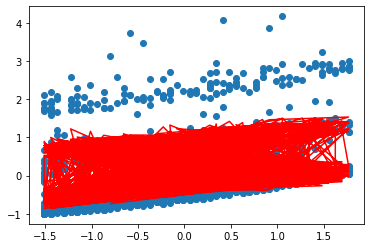

Streaming output truncated to the last 5000 lines.
[-5.98284753]
[-6.18580219]
[-6.72390846]
[-7.91034102]
[-7.38380621]
[-7.16786703]
[-6.51043733]
[-6.35729979]
[-6.18811141]
[-5.79947201]
[-5.3412471]
[-5.08956512]
[-4.93894326]
[-4.79569204]
[-4.76253709]
[-4.64978149]
[-4.34056545]
[-4.01535935]
[-4.22334747]
[-4.35407521]
[-4.08532901]
[-5.0440267]
[-4.56019082]
[-4.25125715]
[-3.99324238]
[-5.0663283]
[-5.21049957]
[-6.25995648]
[-5.78817494]
[-6.95525396]
[-7.59047664]
[-7.04323244]
[-6.94711267]
[-6.44922338]
[-6.22508996]
[-7.79387024]
[-7.61543082]
[-7.33891683]
[-7.0591839]
[-6.60174761]
[-6.35349458]
[-6.1200672]
[-5.92660359]
[-5.8434167]
[-5.55264568]
[-6.35540899]
[-6.47141009]
[-5.97897355]
[-6.00458866]
[-5.38563163]
[-5.42404045]
[-5.18526744]
[-4.95966025]
[-4.72699363]
[-4.50801538]
[-4.43877584]
[-4.28188939]
[-3.88482141]
[-3.73780824]
[-3.3946247]
[-2.90623254]
[-2.68635098]
[-2.27342573]
[-1.92133748]
[-1.6152962]
[-1.23142509]
[-1.0623011]
[-1.12221296]
[-2.48

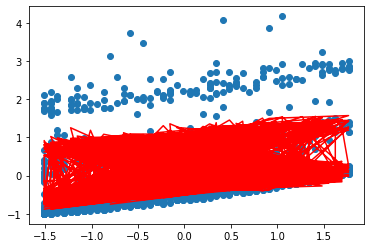

Streaming output truncated to the last 5000 lines.
[-5.65811578]
[-5.86862187]
[-6.41833663]
[-7.61201231]
[-7.08328283]
[-6.86997452]
[-6.22120491]
[-6.08730844]
[-5.92000891]
[-5.54062319]
[-5.06853019]
[-4.83244059]
[-4.6982842]
[-4.55784816]
[-4.52313386]
[-4.41710468]
[-4.11124463]
[-3.79916221]
[-4.01008604]
[-4.14514577]
[-3.88065569]
[-4.81729171]
[-4.34692193]
[-4.01838553]
[-3.73522532]
[-4.78454921]
[-4.92480522]
[-5.97306313]
[-5.4840264]
[-6.6200245]
[-7.25647042]
[-6.71137623]
[-6.6234022]
[-6.13934412]
[-5.91232673]
[-7.48524158]
[-7.32146142]
[-7.05514716]
[-6.7750235]
[-6.32825645]
[-6.08328757]
[-5.85283189]
[-5.66196495]
[-5.58796665]
[-5.30027697]
[-6.11716054]
[-6.23367334]
[-5.7528933]
[-5.78663147]
[-5.16477557]
[-5.19987615]
[-4.96194829]
[-4.75203494]
[-4.51718823]
[-4.31060627]
[-4.24897934]
[-4.10266626]
[-3.71564066]
[-3.58840811]
[-3.22157483]
[-2.71661307]
[-2.50993685]
[-2.10867582]
[-1.75988346]
[-1.45564711]
[-1.05026485]
[-0.87587378]
[-0.90260687]
[-2

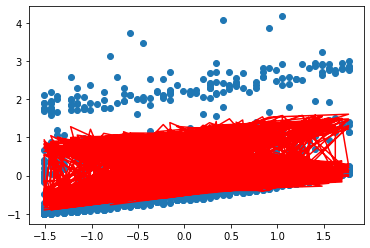

Streaming output truncated to the last 5000 lines.
[-5.34886449]
[-5.5665944]
[-6.12733035]
[-7.32795824]
[-6.7972857]
[-6.58651468]
[-5.94607638]
[-5.83038971]
[-5.66484455]
[-5.29434864]
[-4.80899298]
[-4.58770559]
[-4.46915116]
[-4.33133062]
[-4.29510496]
[-4.19537532]
[-3.89273726]
[-3.5932]
[-3.80677495]
[-3.94584458]
[-3.68534998]
[-4.60110294]
[-4.14360074]
[-3.79629568]
[-3.489149]
[-4.51594819]
[-4.65241723]
[-5.69960144]
[-5.19404072]
[-6.30048904]
[-6.93815742]
[-6.39513667]
[-6.31492638]
[-5.84411362]
[-5.61433723]
[-7.19118775]
[-7.04121472]
[-6.78453815]
[-6.50414133]
[-6.06744635]
[-5.82564128]
[-5.59805188]
[-5.40961249]
[-5.34430686]
[-5.0595803]
[-5.88994429]
[-6.0070267]
[-5.53731306]
[-5.57871252]
[-4.95423094]
[-4.98609209]
[-4.74901314]
[-4.55406019]
[-4.31712252]
[-4.12225471]
[-4.06782942]
[-3.93162478]
[-3.554211]
[-3.44573528]
[-3.05629179]
[-2.53545499]
[-2.3414553]
[-1.95120344]
[-1.60552955]
[-1.30307333]
[-0.87719046]
[-0.69788771]
[-0.69293509]
[-1.985387

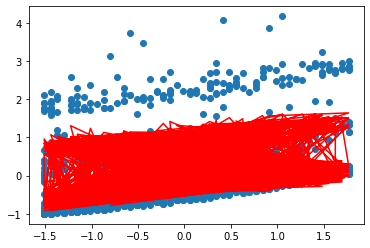

Streaming output truncated to the last 5000 lines.
[-5.05435246]
[-5.27899258]
[-5.85019198]
[-7.05749223]
[-6.52510794]
[-6.31678372]
[-5.68435889]
[-5.58590647]
[-5.42198989]
[-5.06003322]
[-4.56199438]
[-4.35475933]
[-4.25098912]
[-4.11559736]
[-4.07790735]
[-3.98407674]
[-3.6845319]
[-3.39698669]
[-3.61294986]
[-3.75572904]
[-3.49898473]
[-4.39496994]
[-3.94976312]
[-3.58448903]
[-3.25446164]
[-4.25990835]
[-4.39271571]
[-5.43894184]
[-4.91755857]
[-5.99591236]
[-6.63479931]
[-6.09377714]
[-6.020967]
[-5.56283768]
[-5.33042145]
[-6.91101878]
[-6.7740501]
[-6.52648028]
[-6.24591698]
[-5.81873009]
[-5.57997243]
[-5.35514709]
[-5.16897655]
[-5.11189511]
[-4.83001722]
[-5.67325072]
[-5.79095359]
[-5.33174598]
[-5.38037109]
[-4.75351618]
[-4.78220806]
[-4.54597944]
[-4.3652881]
[-4.12634478]
[-3.94254659]
[-3.8949342]
[-3.76839367]
[-3.40017931]
[-3.30949073]
[-2.89843174]
[-2.36238675]
[-2.18055498]
[-1.80069386]
[-1.45797027]
[-1.15726717]
[-0.71184669]
[-0.52796475]
[-0.49275276]
[-1

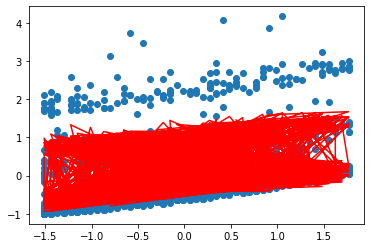

Streaming output truncated to the last 5000 lines.
[-4.77387415]
[-5.00512423]
[-5.58625745]
[-6.7999609]
[-6.26607732]
[-6.06011237]
[-5.43539389]
[-5.35325286]
[-5.19084725]
[-4.83709209]
[-4.3269247]
[-4.13303035]
[-4.04326992]
[-3.91013243]
[-3.871024]
[-3.78271669]
[-3.48614134]
[-3.21005943]
[-3.42816807]
[-3.57437686]
[-3.32115215]
[-4.19842501]
[-3.76496661]
[-3.38249003]
[-3.03063687]
[-4.01584167]
[-4.14510959]
[-5.19048427]
[-4.65395132]
[-5.70559369]
[-6.34569253]
[-5.80659586]
[-5.74083978]
[-5.29485511]
[-5.05991265]
[-6.64407744]
[-6.51935683]
[-6.2803922]
[-5.99975898]
[-5.58154754]
[-5.34572473]
[-5.12356439]
[-4.93951378]
[-4.89021396]
[-4.61107399]
[-5.46659375]
[-5.58496138]
[-5.1357277]
[-5.1911675]
[-4.56217222]
[-4.587766]
[-4.35238703]
[-4.18529153]
[-3.94442423]
[-3.77108666]
[-3.72991944]
[-3.61261836]
[-3.25320843]
[-3.17938848]
[-2.74766577]
[-2.19705269]
[-2.0268998]
[-1.65684552]
[-1.31691283]
[-1.01793397]
[-0.55389353]
[-0.36574343]
[-0.30163467]
[-1.532

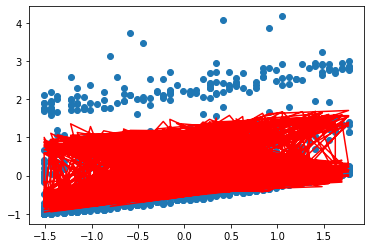

Streaming output truncated to the last 5000 lines.
[-4.50675797]
[-4.74433058]
[-5.33489465]
[-6.55474245]
[-6.01955455]
[-5.81586423]
[-5.19855543]
[-5.13185275]
[-4.97084813]
[-4.62496923]
[-4.1032041]
[-3.92197506]
[-3.84549101]
[-3.71444467]
[-3.67396274]
[-3.59082624]
[-3.29710151]
[-3.03197741]
[-3.25200753]
[-3.40138506]
[-3.15146297]
[-4.01102221]
[-3.58878937]
[-3.18984506]
[-2.81717259]
[-3.78318768]
[-3.90903538]
[-4.95365684]
[-4.40261954]
[-5.4288651]
[-6.07016666]
[-5.53292421]
[-5.47389273]
[-5.03953608]
[-4.80217577]
[-6.3897377]
[-6.27655269]
[-6.04571942]
[-5.76510349]
[-5.35536449]
[-5.1223677]
[-4.90277641]
[-4.72070601]
[-4.67876965]
[-4.40226051]
[-5.26950966]
[-5.38858039]
[-4.94881534]
[-5.01068214]
[-4.37976142]
[-4.40232904]
[-4.1677971]
[-4.01366309]
[-3.77095001]
[-3.60749765]
[-3.57242775]
[-3.46396025]
[-3.11297644]
[-3.05515508]
[-2.60367925]
[-2.03911248]
[-1.88016823]
[-1.51936952]
[-1.18207668]
[-0.88479152]
[-0.40300559]
[-0.21087825]
[-0.11917437]
[-

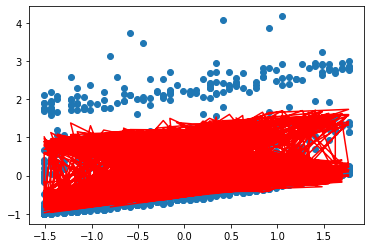

Streaming output truncated to the last 5000 lines.
[-4.25236458]
[-4.4959846]
[-5.09550191]
[-6.32124516]
[-5.78493163]
[-5.58343415]
[-4.97324852]
[-4.92115825]
[-4.76145186]
[-4.42313601]
[-3.8902811]
[-3.72107642]
[-3.65717414]
[-3.52806655]
[-3.48625498]
[-3.40795867]
[-3.11697034]
[-2.86232078]
[-3.08406591]
[-3.23636913]
[-2.98954556]
[-3.83233633]
[-3.42082925]
[-3.00612144]
[-2.61358985]
[-3.56141216]
[-3.6839558]
[-4.72791446]
[-4.1629917]
[-5.16508996]
[-5.80758283]
[-5.27212518]
[-5.21950463]
[-4.7962807]
[-4.55660595]
[-6.14740321]
[-6.04508259]
[-5.82193306]
[-5.54141299]
[-5.13967139]
[-4.90939544]
[-4.69228027]
[-4.51205903]
[-4.47709102]
[-4.20310918]
[-5.08155608]
[-5.20136272]
[-4.77058651]
[-4.8385146]
[-4.20586657]
[-4.22548045]
[-3.99179122]
[-3.85001429]
[-3.6055303]
[-3.45141944]
[-3.42211783]
[-3.32209601]
[-2.97917601]
[-2.93652899]
[-2.46617125]
[-1.8882404]
[-1.74005272]
[-1.38798913]
[-1.053193]
[-0.75756963]
[-0.25887151]
[-0.06303899]
[0.0550166]
[-1.11976

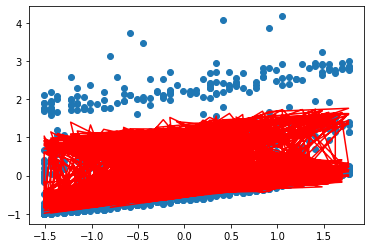

Streaming output truncated to the last 5000 lines.
[-4.0100854]
[-4.25948947]
[-4.86750648]
[-6.09890589]
[-5.56163034]
[-5.36224662]
[-4.7589076]
[-4.72064834]
[-4.56214417]
[-4.23108981]
[-3.68763124]
[-3.52984259]
[-3.47786421]
[-3.35055301]
[-3.30745461]
[-3.2336884]
[-2.94532672]
[-2.70068972]
[-2.92395963]
[-3.0789622]
[-2.83504521]
[-3.66196191]
[-3.26070286]
[-2.83090644]
[-2.41943179]
[-3.35000589]
[-3.46935859]
[-4.51273763]
[-3.93452285]
[-4.91366146]
[-5.5573323]
[-5.02359186]
[-4.9770836]
[-4.56451755]
[-4.32262704]
[-5.91650591]
[-5.8244174]
[-5.60852872]
[-5.32817506]
[-4.93398224]
[-4.70632551]
[-4.49159648]
[-4.31310149]
[-4.2847285]
[-4.01317394]
[-4.90231099]
[-5.02288133]
[-4.60063834]
[-4.67428276]
[-4.04008994]
[-4.0568228]
[-3.82397037]
[-3.6939746]
[-3.44779143]
[-3.30250834]
[-3.27866377]
[-3.18671687]
[-2.8515137]
[-2.82326015]
[-2.33485397]
[-1.74412478]
[-1.60625908]
[-1.26243927]
[-0.93000421]
[-0.63600955]
[-0.12119335]
[0.07808996]
[0.22130949]
[-0.927656

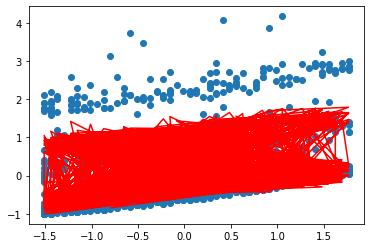

Streaming output truncated to the last 5000 lines.
[-3.77934109]
[-4.03427714]
[-4.65036316]
[-5.88718872]
[-5.34910076]
[-5.15175438]
[-4.55499504]
[-4.52982755]
[-4.37243588]
[-4.04835277]
[-3.49475568]
[-3.34780571]
[-3.30712813]
[-3.18148039]
[-3.13713693]
[-3.06760997]
[-2.78176953]
[-2.54670341]
[-2.771323]
[-2.92881419]
[-2.68762327]
[-3.49951236]
[-3.10804469]
[-2.66380643]
[-2.23426264]
[-3.14848353]
[-3.26475538]
[-4.30763121]
[-3.7166934]
[-4.67400122]
[-5.31883494]
[-4.78674601]
[-4.74606569]
[-4.34370236]
[-4.09969026]
[-5.69650469]
[-5.61405263]
[-5.40502528]
[-5.12490122]
[-4.73783352]
[-4.51269783]
[-4.30026789]
[-4.12338387]
[-4.10125309]
[-3.83202923]
[-4.7313718]
[-4.85272903]
[-4.43858664]
[-4.51762195]
[-3.8820524]
[-3.89597698]
[-3.66395408]
[-3.54519069]
[-3.29737703]
[-3.16043629]
[-3.14175435]
[-3.05752798]
[-2.72970937]
[-2.71510946]
[-2.20945213]
[-1.60646739]
[-1.47850597]
[-1.14246606]
[-0.81226356]
[-0.51986359]
[0.01031397]
[0.21281023]
[0.38005912]
[-0.7

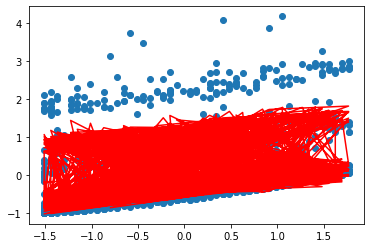

Streaming output truncated to the last 5000 lines.
[-3.55958013]
[-3.81980692]
[-4.44355298]
[-5.6855836]
[-5.14681987]
[-4.95143697]
[-4.36099979]
[-4.34822464]
[-4.19186171]
[-3.87447051]
[-3.31117998]
[-3.17452072]
[-3.14455375]
[-3.02044537]
[-2.97489756]
[-2.90933714]
[-2.62591665]
[-2.39999916]
[-2.62580741]
[-2.7855911]
[-2.54695651]
[-3.34461903]
[-2.96250628]
[-2.50444591]
[-2.0576667]
[-2.95638245]
[-3.06968053]
[-4.1121233]
[-3.50900791]
[-4.445558]
[-5.09153798]
[-4.56103673]
[-4.52591356]
[-4.13331667]
[-3.88727292]
[-5.4868841]
[-5.41350737]
[-5.2109639]
[-4.9311258]
[-4.55078315]
[-4.32807367]
[-4.11785857]
[-3.94247747]
[-3.92625547]
[-3.65926906]
[-4.56835448]
[-4.69051755]
[-4.28406498]
[-4.36818422]
[-3.73139248]
[-3.74258143]
[-3.51137953]
[-3.40332557]
[-3.15394725]
[-3.02489018]
[-3.01109237]
[-2.93424781]
[-2.61349557]
[-2.61184832]
[-2.08970251]
[-1.47498292]
[-1.35652432]
[-1.02782635]
[-0.69973469]
[-0.40889461]
[0.13592318]
[0.34141007]
[0.53160457]
[-0.56954

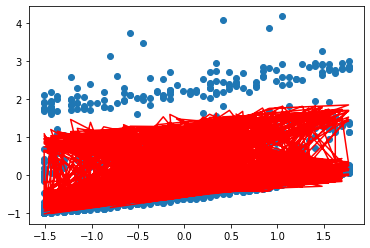

Streaming output truncated to the last 5000 lines.
[-3.35027751]
[-3.61556413]
[-4.2465819]
[-5.49360511]
[-4.95429022]
[-4.76079944]
[-4.17643603]
[-4.17539147]
[-4.01997911]
[-3.70901101]
[-3.13645288]
[-3.00956424]
[-2.98974886]
[-2.86706401]
[-2.82035153]
[-2.7585019]
[-2.47740408]
[-2.26023157]
[-2.48708052]
[-2.64897422]
[-2.41273639]
[-3.19693045]
[-2.82375544]
[-2.35246675]
[-1.8892475]
[-2.7732617]
[-2.8836901]
[-3.92576411]
[-3.31099402]
[-4.22780633]
[-4.87491465]
[-4.34593913]
[-4.31611524]
[-3.93286665]
[-3.68487713]
[-5.28715313]
[-5.22232313]
[-5.02590695]
[-4.74640488]
[-4.37240947]
[-4.15203466]
[-3.94395291]
[-3.76997343]
[-3.75934507]
[-3.49450614]
[-4.41289268]
[-4.53587671]
[-4.13672388]
[-4.2256375]
[-3.58776563]
[-3.5962913]
[-3.36590076]
[-3.26805789]
[-3.01717799]
[-2.89557118]
[-2.88639405]
[-2.81660754]
[-2.50261699]
[-2.51325816]
[-1.97535337]
[-1.34939837]
[-1.2400568]
[-0.91828733]
[-0.59219119]
[-0.3028756]
[0.25589522]
[0.46416495]
[0.67626987]
[-0.40275

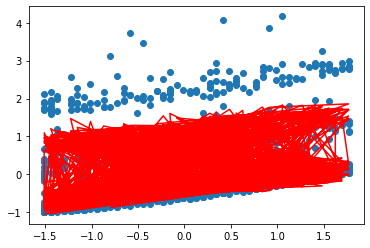

Streaming output truncated to the last 5000 lines.
[-3.15093343]
[-3.42105889]
[-4.05897962]
[-5.31079127]
[-4.77103868]
[-4.57937108]
[-4.00084193]
[-4.01090185]
[-3.85636707]
[-3.55156346]
[-2.97014517]
[-2.85253352]
[-2.8423402]
[-2.7209708]
[-2.6731323]
[-2.61475369]
[-2.33588506]
[-2.12707162]
[-2.35482549]
[-2.51865948]
[-2.28466838]
[-3.05611146]
[-2.69147546]
[-2.20752736]
[-1.72862682]
[-2.59870097]
[-2.70636082]
[-3.74812497]
[-3.12220134]
[-4.02024542]
[-4.66846301]
[-4.14095313]
[-4.11618291]
[-3.7418819]
[-3.49202863]
[-5.09684406]
[-5.04006284]
[-4.84943702]
[-4.57031529]
[-4.20231035]
[-3.98418182]
[-3.77815464]
[-3.60548183]
[-3.60014924]
[-3.337371]
[-4.26463693]
[-4.38845353]
[-3.99623008]
[-4.08966495]
[-3.45084337]
[-3.45677766]
[-3.22718786]
[-3.1390812]
[-2.88676014]
[-2.77219407]
[-2.76738843]
[-2.70435048]
[-2.39682989]
[-2.41913003]
[-1.86616403]
[-1.22945259]
[-1.12885735]
[-0.81362605]
[-0.48941621]
[-0.20158927]
[0.37047968]
[0.58133809]
[0.81436466]
[-0.243

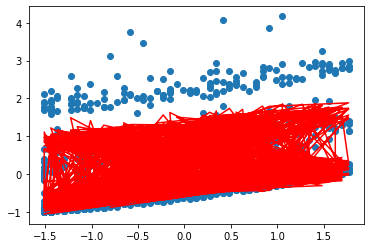

Streaming output truncated to the last 5000 lines.
[-2.96107205]
[-3.2358249]
[-3.88029843]
[-5.13670237]
[-4.59661524]
[-4.40670422]
[-3.83377844]
[-3.85435041]
[-3.70062515]
[-3.40173727]
[-2.81184861]
[-2.7030454]
[-2.70197253]
[-2.58181779]
[-2.53289087]
[-2.47775849]
[-2.20102927]
[-2.00020599]
[-2.22874026]
[-2.39435677]
[-2.16247136]
[-2.9218425]
[-2.56536442]
[-2.06930191]
[-1.57544392]
[-2.43229965]
[-2.53728915]
[-3.57879731]
[-2.94220044]
[-3.82239791]
[-4.47170472]
[-3.94560226]
[-3.92565178]
[-3.55991436]
[-3.3082757]
[-4.91551133]
[-4.86630983]
[-4.68115604]
[-4.40245361]
[-4.04010224]
[-3.82413469]
[-3.6200859]
[-3.4486308]
[-3.44831242]
[-3.1875112]
[-4.12325388]
[-4.24791145]
[-3.86226571]
[-3.95996422]
[-3.32031257]
[-3.3237268]
[-3.09492626]
[-3.01610322]
[-2.76239895]
[-2.65448665]
[-2.65381677]
[-2.59723154]
[-2.29590159]
[-2.32926418]
[-1.76190431]
[-1.11489578]
[-1.02269068]
[-0.71362909]
[-0.39120209]
[-0.10482766]
[0.47991535]
[0.69318101]
[0.9461848]
[-0.09186

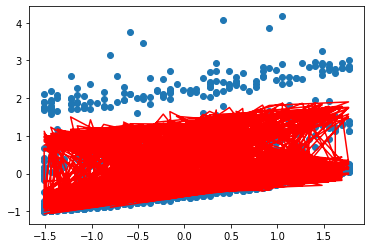

Streaming output truncated to the last 5000 lines.
[-2.78024041]
[-3.05941827]
[-3.71011214]
[-4.97091993]
[-4.43059186]
[-4.24237312]
[-3.67482816]
[-3.70535163]
[-3.5523724]
[-3.25916099]
[-2.66117487]
[-2.56073538]
[-2.56830779]
[-2.44927371]
[-2.39929497]
[-2.3471981]
[-2.07252205]
[-1.87933624]
[-2.10853689]
[-2.27578926]
[-2.04587701]
[-2.79381886]
[-2.4451345]
[-1.93747965]
[-1.42935473]
[-2.27367589]
[-2.37609035]
[-3.41739172]
[-2.77058187]
[-3.63380883]
[-4.284184]
[-3.75943255]
[-3.74407899]
[-3.3865372]
[-3.13318803]
[-4.7427305]
[-4.70066687]
[-4.52068436]
[-4.24243528]
[-3.88541934]
[-3.67153047]
[-3.46938645]
[-3.29906571]
[-3.30349535]
[-3.04459052]
[-3.98842553]
[-4.11392961]
[-3.73452766]
[-3.83624682]
[-3.19587472]
[-3.19683953]
[-2.968816]
[-2.89884527]
[-2.64381332]
[-2.54218912]
[-2.54543201]
[-2.49501672]
[-2.19960996]
[-2.24346968]
[-1.66235418]
[-1.00548897]
[-0.92133184]
[-0.61809208]
[-0.29734997]
[-0.01239173]
[0.5844306]
[0.79993404]
[1.07201301]
[0.0529271

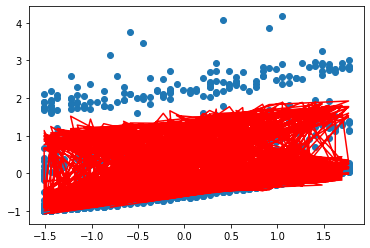

Streaming output truncated to the last 5000 lines.
[-2.60800727]
[-2.8914165]
[-3.548015]
[-4.81304565]
[-4.2725614]
[-4.08597282]
[-3.52359428]
[-3.56353885]
[-3.41124646]
[-3.12348144]
[-2.51775459]
[-2.42525668]
[-2.44102423]
[-2.3230232]
[-2.27202823]
[-2.22276935]
[-1.95006363]
[-1.76417813]
[-1.99394085]
[-2.16269286]
[-1.93462918]
[-2.67175001]
[-2.33051127]
[-1.81176418]
[-1.29003103]
[-2.12246571]
[-2.22239761]
[-3.26353704]
[-2.60695525]
[-3.45404452]
[-4.10546649]
[-3.58201147]
[-3.57104256]
[-3.22134388]
[-2.96635577]
[-4.57809727]
[-4.54275529]
[-4.36765987]
[-4.08989369]
[-3.7379128]
[-3.52602319]
[-3.32571282]
[-3.15644836]
[-3.16537437]
[-2.90828822]
[-3.85984858]
[-3.98620203]
[-3.61272685]
[-3.71823744]
[-3.07724527]
[-3.07583045]
[-2.84857105]
[-2.78704156]
[-2.53073516]
[-2.43505356]
[-2.44199829]
[-2.39748259]
[-2.107743]
[-2.16156401]
[-1.56730324]
[-0.90100359]
[-0.82456574]
[-0.52681943]
[-0.20766944]
[0.07590901]
[0.68424389]
[0.90182682]
[1.1921194]
[0.1910481

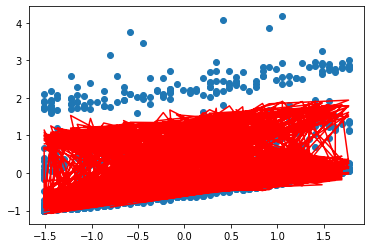

Streaming output truncated to the last 5000 lines.
[-2.44396207]
[-2.73141737]
[-3.39362075]
[-4.66270042]
[-4.12213661]
[-3.93711822]
[-3.37969954]
[-3.42856329]
[-3.2769026]
[-2.99436275]
[-2.3812364]
[-2.29627939]
[-2.31981563]
[-2.202766]
[-2.15078941]
[-2.1041834]
[-1.83336846]
[-1.65446094]
[-1.88469045]
[-2.05481559]
[-1.82848343]
[-2.55535893]
[-2.22123315]
[-1.69187278]
[-1.1571598]
[-1.97832219]
[-2.0758612]
[-3.11687956]
[-2.45094835]
[-3.28269166]
[-3.9351383]
[-3.41292694]
[-3.40614045]
[-3.06394712]
[-2.80738847]
[-4.42122648]
[-4.39221407]
[-4.22173726]
[-3.94447939]
[-3.59724988]
[-3.38728295]
[-3.18873752]
[-3.02045623]
[-3.03364066]
[-2.77829836]
[-3.73723368]
[-3.86443703]
[-3.49658757]
[-3.60567344]
[-2.96415292]
[-2.96042741]
[-2.73391867]
[-2.68043864]
[-2.42290884]
[-2.33284333]
[-2.34329037]
[-2.30441586]
[-2.0200983]
[-2.0833727]
[-1.47655036]
[-0.80122106]
[-0.73218676]
[-0.43962388]
[-0.12197819]
[0.16025681]
[0.77956412]
[0.99907873]
[1.30676206]
[0.32280448

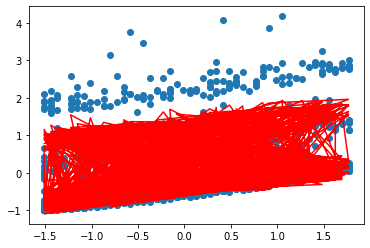

Streaming output truncated to the last 5000 lines.
[-2.28771395]
[-2.57903802]
[-3.24656167]
[-4.51952342]
[-3.9789491]
[-3.79544301]
[-3.24278526]
[-3.30009327]
[-3.14901288]
[-2.87148554]
[-2.2512861]
[-2.17348963]
[-2.20439054]
[-2.08821628]
[-2.03529168]
[-1.99116506]
[-1.72216448]
[-1.54992681]
[-1.7805362]
[-1.95191705]
[-1.72720642]
[-2.44438148]
[-2.11705075]
[-1.57753583]
[-1.03044244]
[-1.84091466]
[-1.93614769]
[-2.9770821]
[-2.3022063]
[-3.11935626]
[-3.77280503]
[-3.25178629]
[-3.24898955]
[-2.91397801]
[-2.65591425]
[-4.27175123]
[-4.24869907]
[-4.08258717]
[-3.80585923]
[-3.46311327]
[-3.25499515]
[-3.05814831]
[-2.89078172]
[-2.90799959]
[-2.65432908]
[-3.62030485]
[-3.74835647]
[-3.38584693]
[-3.49830417]
[-2.85633909]
[-2.85037081]
[-2.62459878]
[-2.57879482]
[-2.32009056]
[-2.23533263]
[-2.24909323]
[-2.21561286]
[-1.93648266]
[-2.00872902]
[-1.38990325]
[-0.7059323]
[-0.6439983]
[-0.35632622]
[-0.04010167]
[0.2408261]
[0.8705911]
[1.09189938]
[1.41618755]
[0.4484880

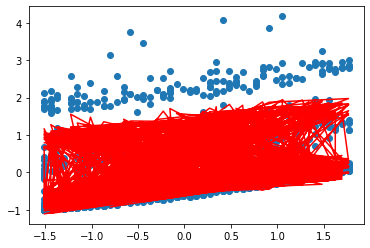

Streaming output truncated to the last 5000 lines.
[-2.13889079]
[-2.43391399]
[-3.10648767]
[-4.38317119]
[-3.84264848]
[-3.66059878]
[-3.11251043]
[-3.17781325]
[-3.02726534]
[-2.75454607]
[-2.12758575]
[-2.05658878]
[-2.09447159]
[-1.9791019]
[-1.92526194]
[-1.88345215]
[-1.61619254]
[-1.45033014]
[-1.68124024]
[-1.85376787]
[-1.63057544]
[-2.3385658]
[-2.0177263]
[-1.46849616]
[-0.90959417]
[-1.70992793]
[-1.80293919]
[-2.84382335]
[-2.16039072]
[-2.96366285]
[-3.61809082]
[-3.09821542]
[-3.09922485]
[-2.77108517]
[-2.51157883]
[-4.129322]
[-4.11188221]
[-3.9498955]
[-3.67371565]
[-3.33520034]
[-3.12885981]
[-2.93364748]
[-2.76713152]
[-2.78817006]
[-2.536102]
[-3.50879886]
[-3.63769519]
[-3.28025419]
[-3.39589051]
[-2.75355726]
[-2.74541307]
[-2.52036342]
[-2.4818796]
[-2.22204783]
[-2.14230594]
[-2.15920156]
[-2.13087917]
[-1.8567117]
[-1.93747361]
[-1.30717811]
[-0.61493737]
[-0.55981247]
[-0.27675492]
[0.0381272]
[0.31778374]
[0.95751589]
[1.18048903]
[1.52063145]
[0.56837771]


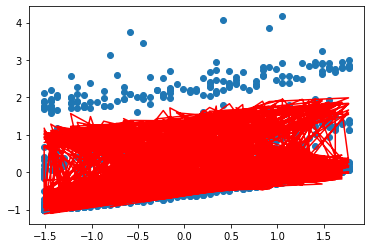

Streaming output truncated to the last 5000 lines.
[-1.9971383]
[-2.29569833]
[-2.97306545]
[-4.25331684]
[-3.71290141]
[-3.53225416]
[-2.98855082]
[-3.06142313]
[-2.91136317]
[-2.6432555]
[-2.00983291]
[-1.94529272]
[-1.98979478]
[-1.87516375]
[-1.82044013]
[-1.78079487]
[-1.51520575]
[-1.35543702]
[-1.58657585]
[-1.76014922]
[-1.53837793]
[-2.23767175]
[-1.92303315]
[-1.36450848]
[-0.79434336]
[-1.58506158]
[-1.67593263]
[-2.71679702]
[-2.025179]
[-2.8152535]
[-3.47063753]
[-2.95185787]
[-2.95649855]
[-2.63493385]
[-2.37404476]
[-3.99360583]
[-3.98145073]
[-3.8233627]
[-3.54774592]
[-3.21322247]
[-3.00859088]
[-2.81495122]
[-2.6492259]
[-2.67388391]
[-2.42335155]
[-3.40246461]
[-3.53220035]
[-3.17957025]
[-3.29820427]
[-2.6555724]
[-2.64531806]
[-2.42097611]
[-2.3894732]
[-2.12855895]
[-2.05355762]
[-2.07341936]
[-2.05002917]
[-1.78060938]
[-1.86945415]
[-1.22819924]
[-0.52804508]
[-0.47944963]
[-0.20074583]
[0.11286835]
[0.39128939]
[1.04052121]
[1.26503898]
[1.62031879]
[0.68273937

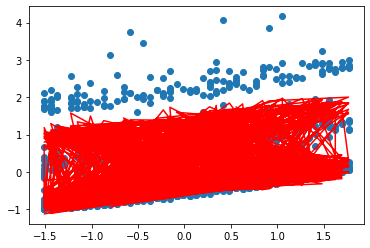

Streaming output truncated to the last 5000 lines.
[-1.86211918]
[-2.16406077]
[-2.8459777]
[-4.1296492]
[-3.58939082]
[-3.41009395]
[-2.87059814]
[-2.95063746]
[-2.80102401]
[-2.53733915]
[-1.89773989]
[-1.83933114]
[-1.89010883]
[-1.77615514]
[-1.72057863]
[-1.68295522]
[-1.4189689]
[-1.26502463]
[-1.49632686]
[-1.67085235]
[-1.45041103]
[-2.14147037]
[-1.83275521]
[-1.26533885]
[-0.68443092]
[-1.46602924]
[-1.55483905]
[-2.59571121]
[-1.89626354]
[-2.6737871]
[-3.33010385]
[-2.81237404]
[-2.82047924]
[-2.50520518]
[-2.24299058]
[-3.86428553]
[-3.85710648]
[-3.7027031]
[-3.42766145]
[-3.09690441]
[-2.89391559]
[-2.7017889]
[-2.5367981]
[-2.56488528]
[-2.31582443]
[-3.3010626]
[-3.43163091]
[-3.08356709]
[-3.20502775]
[-2.5621605]
[-2.54986059]
[-2.3262114]
[-2.30136604]
[-2.03941248]
[-1.96889138]
[-1.99155948]
[-1.97288564]
[-1.7080077]
[-1.8045251]
[-1.1527987]
[-0.44507262]
[-0.40273809]
[-0.12814188]
[0.18427488]
[0.46149579]
[1.11978176]
[1.34573198]
[1.71546457]
[0.79182693]
[-

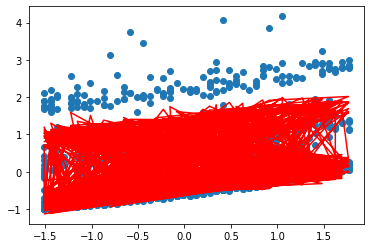

Streaming output truncated to the last 5000 lines.
[-1.73351229]
[-2.03868688]
[-2.72492232]
[-4.01187209]
[-3.47181507]
[-3.29381833]
[-2.75835929]
[-2.8451847]
[-2.69597924]
[-2.43653578]
[-1.79103298]
[-1.73844682]
[-1.79517457]
[-1.6818412]
[-1.62544166]
[-1.58970645]
[-1.32725793]
[-1.17888077]
[-1.41028721]
[-1.58567807]
[-1.36648111]
[-2.04974333]
[-1.74668649]
[-1.17076416]
[-0.57960975]
[-1.35255797]
[-1.43938296]
[-2.48028772]
[-1.77335108]
[-2.53893848]
[-3.19616457]
[-2.67944031]
[-2.69085118]
[-2.38159543]
[-2.11811007]
[-3.74105895]
[-3.73856521]
[-3.58764424]
[-3.31318715]
[-2.98598366]
[-2.78457383]
[-2.59390252]
[-2.42959375]
[-2.4609301]
[-2.213279]
[-3.20436439]
[-3.33575706]
[-2.99202727]
[-3.11615324]
[-2.47310799]
[-2.45882586]
[-2.23585428]
[-2.21735824]
[-1.95440682]
[-1.88811995]
[-1.91344327]
[-1.89927942]
[-1.6387463]
[-1.74254738]
[-1.08081596]
[-0.36584516]
[-0.32951376]
[-0.05879277]
[0.25249332]
[0.52854904]
[1.19546459]
[1.4227426]
[1.80627416]
[0.895882

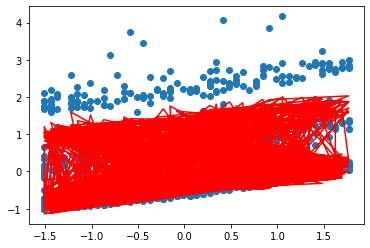

Streaming output truncated to the last 5000 lines.
[-1.61101187]
[-1.91927736]
[-2.6096117]
[-3.89970359]
[-3.35988722]
[-3.18314212]
[-2.65155555]
[-2.74480656]
[-2.59597329]
[-2.34059693]
[-1.68945182]
[-1.64239506]
[-1.70476436]
[-1.59199831]
[-1.5348047]
[-1.50083248]
[-1.23985935]
[-1.09680328]
[-1.32826044]
[-1.50443636]
[-1.28640337]
[-1.96228246]
[-1.66463061]
[-1.0805716]
[-0.47964416]
[-1.24438761]
[-1.32930171]
[-2.37026135]
[-1.656162]
[-2.41039776]
[-3.06850975]
[-2.55274835]
[-2.56731347]
[-2.26381524]
[-1.99911152]
[-3.62363822]
[-3.62555597]
[-3.47792629]
[-3.20406079]
[-2.88020987]
[-2.68031759]
[-2.4910461]
[-2.32737025]
[-2.36178549]
[-2.1154848]
[-3.1121521]
[-3.24435969]
[-2.90474342]
[-3.03138255]
[-2.38821128]
[-2.37200902]
[-2.14969977]
[-2.13725923]
[-1.87334968]
[-1.81106459]
[-1.83890016]
[-1.82904902]
[-1.57267213]
[-1.68338806]
[-1.01209762]
[-0.29019557]
[-0.25961979]
[0.00744532]
[0.31766388]
[0.59258891]
[1.2677294]
[1.49623761]
[1.89294374]
[0.99513772]

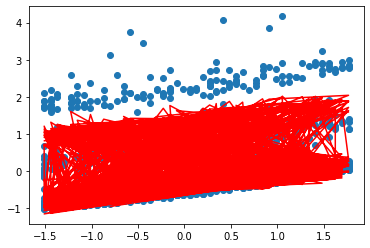

Streaming output truncated to the last 5000 lines.
[-1.4943268]
[-1.80554724]
[-2.49977197]
[-3.79287532]
[-3.25333427]
[-3.07779404]
[-2.54992191]
[-2.64925733]
[-2.50076298]
[-2.24928633]
[-1.5927487]
[-1.55094301]
[-1.61866153]
[-1.50641355]
[-1.44845393]
[-1.41612749]
[-1.15656981]
[-1.01859964]
[-1.25005927]
[-1.42694595]
[-1.21000144]
[-1.8788893]
[-1.58640034]
[-0.99455821]
[-0.38430936]
[-1.14127018]
[-1.22434489]
[-2.26537937]
[-1.5444297]
[-2.28786953]
[-2.94684406]
[-2.4320044]
[-2.44957943]
[-2.151589]
[-1.88571707]
[-3.51174913]
[-3.51782044]
[-3.37330147]
[-3.10003238]
[-2.77934429]
[-2.58091036]
[-2.3929851]
[-2.22989626]
[-2.26722932]
[-2.02222199]
[-3.02421791]
[-3.15722989]
[-2.82151782]
[-2.95052661]
[-2.3072763]
[-2.28921471]
[-2.06755239]
[-2.06088726]
[-1.79605773]
[-1.73755474]
[-1.76776731]
[-1.76204027]
[-1.50963911]
[-1.62692014]
[-0.94649703]
[-0.21796405]
[-0.19290629]
[0.07070998]
[0.37992075]
[0.65374908]
[1.3367289]
[1.56637628]
[1.97566071]
[1.08981278]


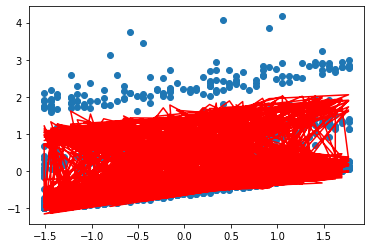

Streaming output truncated to the last 5000 lines.
[-1.38317992]
[-1.69722526]
[-2.39514242]
[-3.69113184]
[-3.15189654]
[-2.97751606]
[-2.45320638]
[-2.55830331]
[-2.41011699]
[-2.16237923]
[-1.50068796]
[-1.4638691]
[-1.53665983]
[-1.42488419]
[-1.36618576]
[-1.33539532]
[-1.07719556]
[-0.94408645]
[-1.17550518]
[-1.35303388]
[-1.13710702]
[-1.79937458]
[-1.51181721]
[-0.91253043]
[-0.29339096]
[-1.04296931]
[-1.12427376]
[-2.1654009]
[-1.4379]
[-2.17107226]
[-2.83088606]
[-2.31692852]
[-2.3373759]
[-2.04465414]
[-1.77766201]
[-3.40513043]
[-3.41511238]
[-3.27353346]
[-3.00086364]
[-2.68315923]
[-2.48612665]
[-2.29949592]
[-2.1369512]
[-2.17704967]
[-1.93328087]
[-2.9403636]
[-3.0741685]
[-2.74216188]
[-2.87340501]
[-2.23011803]
[-2.21025661]
[-1.98922576]
[-1.98806904]
[-1.72235612]
[-1.66742764]
[-1.69988928]
[-1.69810599]
[-1.44950781]
[-1.57302226]
[-0.88387408]
[-0.14899782]
[-0.12923002]
[0.13113283]
[0.43939234]
[0.71215742]
[1.40260905]
[1.63331077]
[2.05460405]
[1.18011839]


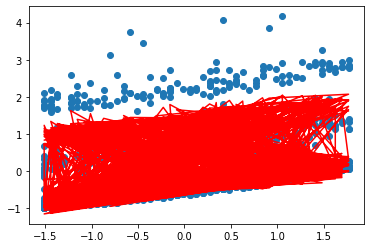

Streaming output truncated to the last 5000 lines.
[-1.2773073]
[-1.59405316]
[-2.29547481]
[-3.59422998]
[-3.05532695]
[-2.88206271]
[-2.36116933]
[-2.47172214]
[-2.32381519]
[-2.07966189]
[-1.41304541]
[-1.38096253]
[-1.45856296]
[-1.3472172]
[-1.28780632]
[-1.25844911]
[-1.00155199]
[-0.87308903]
[-1.10442796]
[-1.28253516]
[-1.06755944]
[-1.72355787]
[-1.44071105]
[-0.83430364]
[-0.20668446]
[-0.9492597]
[-1.02886072]
[-2.07009634]
[-1.33633057]
[-2.05973759]
[-2.72036755]
[-2.20725401]
[-2.23044258]
[-1.94276053]
[-1.67469416]
[-3.30353327]
[-3.31719704]
[-3.1783969]
[-2.9063274]
[-2.59143757]
[-2.39575142]
[-2.2103654]
[-2.04832468]
[-2.09104437]
[-1.84846142]
[-2.86040012]
[-2.99498565]
[-2.66649579]
[-2.79984564]
[-2.15656011]
[-2.13495701]
[-1.91454216]
[-1.91863931]
[-1.65207812]
[-1.60052798]
[-1.63511766]
[-1.63710571]
[-1.39214518]
[-1.52157849]
[-0.82409485]
[-0.08315084]
[-0.06845411]
[0.18883979]
[0.49620152]
[0.76793622]
[1.46550942]
[1.6971864]
[2.12994473]
[1.2662554

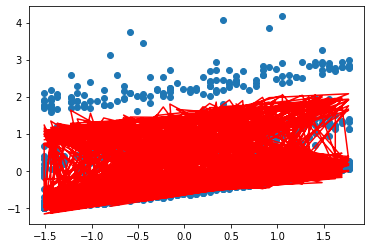

Streaming output truncated to the last 5000 lines.
[-1.17645769]
[-1.49578507]
[-2.20053278]
[-3.50193824]
[-2.96339046]
[-2.79120047]
[-2.2735829]
[-2.38930232]
[-2.24164815]
[-2.00093102]
[-1.32960775]
[-1.30202268]
[-1.38418404]
[-1.27322877]
[-1.21313099]
[-1.18511079]
[-0.92946327]
[-0.805441]
[-1.03666536]
[-1.2152924]
[-1.00120541]
[-1.65126713]
[-1.37291967]
[-0.75970177]
[-0.12399484]
[-0.85992661]
[-0.93788874]
[-1.97924685]
[-1.23949035]
[-1.95360976]
[-2.61503295]
[-2.10272672]
[-2.12853147]
[-1.84566991]
[-1.57657331]
[-3.20672054]
[-3.22385064]
[-3.08767688]
[-2.81620713]
[-2.50397222]
[-2.30957962]
[-2.12539027]
[-1.9638161]
[-2.00902056]
[-1.76757288]
[-2.78414715]
[-2.91950029]
[-2.59434807]
[-2.72968429]
[-2.0864344]
[-2.06314643]
[-1.84333215]
[-1.8524405]
[-1.58506474]
[-1.53670756]
[-1.5733108]
[-1.57890533]
[-1.33742422]
[-1.47247803]
[-0.76703138]
[-0.0202835]
[-0.01044773]
[0.24395131]
[0.55046584]
[0.82120241]
[1.52556338]
[1.75814194]
[2.20184606]
[1.3484157]


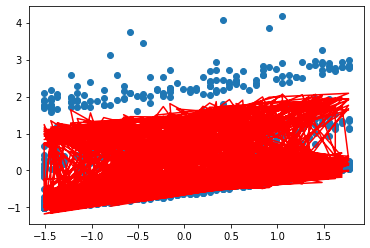

Streaming output truncated to the last 5000 lines.
[-1.08039182]
[-1.40218691]
[-2.11009129]
[-3.41403627]
[-2.87586344]
[-2.70470722]
[-2.1902304]
[-2.31084264]
[-2.16341661]
[-1.92599326]
[-1.25017203]
[-1.22685867]
[-1.3133452]
[-1.20274392]
[-1.14198395]
[-1.11521069]
[-0.86076185]
[-0.74098386]
[-0.97206268]
[-1.15115542]
[-0.93789862]
[-1.5823383]
[-1.30828842]
[-0.6885569]
[-0.04513609]
[-0.77476533]
[-0.85115094]
[-1.89264387]
[-1.14715905]
[-1.85244497]
[-2.51463872]
[-2.00310451]
[-2.03140623]
[-1.75315531]
[-1.48307062]
[-3.11446639]
[-3.13485984]
[-3.00116845]
[-2.73029642]
[-2.42056572]
[-2.22741576]
[-2.04437678]
[-1.88323416]
[-1.93079427]
[-1.69043327]
[-2.71143272]
[-2.84753985]
[-2.5255552]
[-2.6627643]
[-2.01958064]
[-1.99466324]
[-1.77543413]
[-1.78932233]
[-1.52116435]
[-1.47582495]
[-1.51433344]
[-1.52337685]
[-1.28522373]
[-1.42561505]
[-0.71256138]
[0.03973767]
[0.04491408]
[0.2965826]
[0.60229777]
[0.87206784]
[1.58289846]
[1.81630997]
[2.27046399]
[1.42678208]

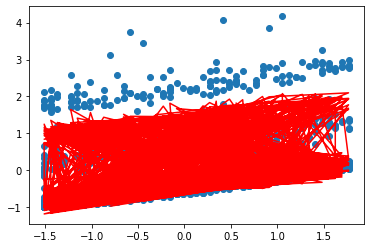

Streaming output truncated to the last 5000 lines.
[-0.98888188]
[-1.31303584]
[-2.02393605]
[-3.3303143]
[-2.79253311]
[-2.62237164]
[-2.11090579]
[-2.23615167]
[-2.08893096]
[-1.85466469]
[-1.17454519]
[-1.15528887]
[-1.24587712]
[-1.13559598]
[-1.07419776]
[-1.04858717]
[-0.7952881]
[-0.67956664]
[-0.91047248]
[-1.08998098]
[-0.87749942]
[-1.51661497]
[-1.24666987]
[-0.62070888]
[0.0300692]
[-0.69358076]
[-0.76845008]
[-1.81008859]
[-1.05912663]
[-1.75601085]
[-2.41895276]
[-1.90815664]
[-1.93884168]
[-1.66500049]
[-1.39396808]
[-3.02655562]
[-3.05002127]
[-2.91867614]
[-2.64839851]
[-2.34102972]
[-2.1490734]
[-1.96714017]
[-1.80639645]
[-1.85618999]
[-1.61686904]
[-2.64209279]
[-2.77893977]
[-2.45996126]
[-2.59893621]
[-1.95584604]
[-1.92935328]
[-1.71069405]
[-1.72914154]
[-1.46023238]
[-1.41774521]
[-1.45805649]
[-1.47039807]
[-1.23542804]
[-1.38088842]
[-0.66056802]
[0.09704022]
[0.09775075]
[0.34684384]
[0.65180489]
[0.92063946]
[1.63763654]
[1.87181708]
[2.33594749]
[1.5015291

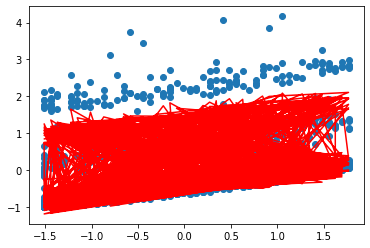

Streaming output truncated to the last 5000 lines.
[-0.90171095]
[-1.22811968]
[-1.94186305]
[-3.25057264]
[-2.71319707]
[-2.54399271]
[-2.03541311]
[-2.16504731]
[-2.01801078]
[-1.78677037]
[-1.10254352]
[-1.08714042]
[-1.18161863]
[-1.07162629]
[-1.00961299]
[-0.98508619]
[-0.73288995]
[-0.62104555]
[-0.85175417]
[-1.03163243]
[-0.81987458]
[-1.45394802]
[-1.18792349]
[-0.55600496]
[0.10179023]
[-0.61618693]
[-0.68959809]
[-1.73139155]
[-0.97519285]
[-1.66408594]
[-2.32775391]
[-1.81766327]
[-1.85062326]
[-1.58099948]
[-1.30905802]
[-2.94278326]
[-2.96914106]
[-2.84001358]
[-2.57032582]
[-2.26518465]
[-2.0743748]
[-1.89350432]
[-1.73312899]
[-1.78504031]
[-1.54671464]
[-2.57597094]
[-2.71354319]
[-2.39741756]
[-2.53805743]
[-1.89508494]
[-1.86706955]
[-1.64896501]
[-1.6717615]
[-1.40213097]
[-1.36233957]
[-1.40435671]
[-1.41985237]
[-1.18792677]
[-1.33820156]
[-0.61093965]
[0.15174608]
[0.14817638]
[0.39484043]
[0.69909014]
[0.96701951]
[1.6898941]
[1.92478416]
[2.3984388]
[1.5728235

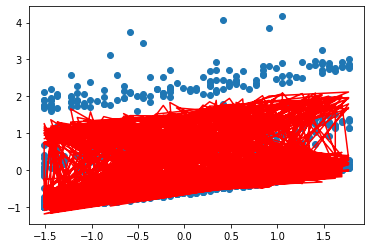

Streaming output truncated to the last 5000 lines.
[-0.81867251]
[-1.14723643]
[-1.86367802]
[-3.17462117]
[-2.63766269]
[-2.46937917]
[-1.963566]
[-2.0973563]
[-1.95048442]
[-1.72214389]
[-1.03399223]
[-1.02224884]
[-1.12041629]
[-1.01068376]
[-0.94807778]
[-0.92456099]
[-0.6734225]
[-0.5652836]
[-0.79577374]
[-0.97597938]
[-0.76489693]
[-1.39419524]
[-1.13191529]
[-0.49429948]
[0.17018837]
[-0.54240656]
[-0.61441569]
[-1.65637214]
[-0.89516678]
[-1.57645912]
[-2.24083139]
[-1.73141491]
[-1.7665465]
[-1.50095605]
[-1.22814258]
[-2.86295399]
[-2.8920344]
[-2.765003]
[-2.49589957]
[-2.19285923]
[-2.00315045]
[-1.82330131]
[-1.66326593]
[-1.71718552]
[-1.47981219]
[-2.51291796]
[-2.65120055]
[-2.33778231]
[-2.47999192]
[-1.83715851]
[-1.80767184]
[-1.59010694]
[-1.61705192]
[-1.34672863]
[-1.30948516]
[-1.35311648]
[-1.37162844]
[-1.14261456]
[-1.29746219]
[-0.5635696]
[0.2039718]
[0.19629997]
[0.44067314]
[0.74425195]
[1.01130577]
[1.73978249]
[1.97532669]
[2.45807379]
[1.64082417]
[0.8

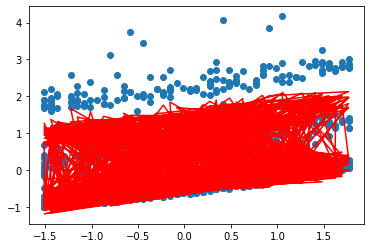

Streaming output truncated to the last 5000 lines.
[-0.73956987]
[-1.07019376]
[-1.78919597]
[-3.10227892]
[-2.56574673]
[-2.39834907]
[-1.89518724]
[-2.03291382]
[-1.88618852]
[-1.66062699]
[-0.968725]
[-0.96045759]
[-1.06212405]
[-0.95262449]
[-0.88944753]
[-0.86687171]
[-0.61674773]
[-0.51215032]
[-0.74240343]
[-0.92289749]
[-0.71244511]
[-1.33722106]
[-1.07851753]
[-0.4354535]
[0.23541752]
[-0.4720707]
[-0.54273193]
[-1.58485824]
[-0.81886639]
[-1.4929292]
[-2.15798435]
[-1.64921194]
[-1.68641659]
[-1.42468327]
[-1.15103328]
[-2.78688176]
[-2.8185251]
[-2.6934749]
[-2.4249493]
[-2.12389013]
[-1.93523874]
[-1.75637104]
[-1.59664907]
[-1.65247329]
[-1.41601107]
[-2.45279155]
[-2.59176927]
[-2.2809203]
[-2.42460992]
[-1.78193439]
[-1.75102643]
[-1.53398629]
[-1.56488858]
[-1.29389999]
[-1.25906473]
[-1.30422349]
[-1.32562002]
[-1.0993909]
[-1.25858214]
[-0.51835596]
[0.25382873]
[0.24222568]
[0.48443835]
[0.78738451]
[1.05359172]
[1.78740811]
[2.02355493]
[2.51498221]
[1.70568271]
[0.

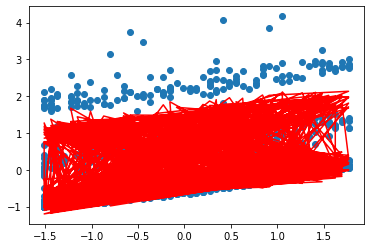

Streaming output truncated to the last 5000 lines.
[-0.66421577]
[-0.99680857]
[-1.71824078]
[-3.03337358]
[-2.49727483]
[-2.33072932]
[-1.83010828]
[-1.97156305]
[-1.82496764]
[-1.60206909]
[-0.90658361]
[-0.90161773]
[-1.00660287]
[-0.8973115]
[-0.8335845]
[-0.81188509]
[-0.56273409]
[-0.46152141]
[-0.69152145]
[-0.87226811]
[-0.66240332]
[-1.28289621]
[-1.02760846]
[-0.37933455]
[0.29762447]
[-0.40501829]
[-0.47438386]
[-1.51668578]
[-0.74611814]
[-1.41330439]
[-2.07902139]
[-1.57086417]
[-1.61004789]
[-1.35200306]
[-1.07755057]
[-2.71438932]
[-2.74844519]
[-2.62526763]
[-2.35731257]
[-2.05812161]
[-1.87048557]
[-1.6925609]
[-1.53312759]
[-1.5907583]
[-1.35516766]
[-2.395456]
[-2.53511342]
[-2.22670261]
[-2.3717876]
[-1.72928639]
[-1.69700579]
[-1.48047571]
[-1.51515304]
[-1.24352552]
[-1.21096642]
[-1.25757056]
[-1.2817257]
[-1.05815984]
[-1.22147723]
[-0.47520135]
[0.30142333]
[0.286053]
[0.52622822]
[0.82857788]
[1.09396674]
[1.83287265]
[2.06957415]
[2.56928795]
[1.76754387]
[0.

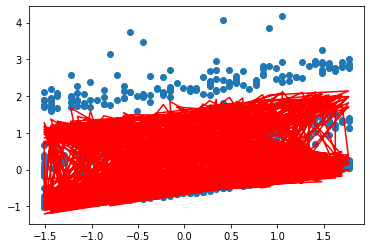

Streaming output truncated to the last 5000 lines.
[-0.59243188]
[-0.92690651]
[-1.65064471]
[-2.96774114]
[-2.43208107]
[-2.26635524]
[-1.76816881]
[-1.91315478]
[-1.76667388]
[-1.54632697]
[-0.84741748]
[-0.84558749]
[-0.95372039]
[-0.84461431]
[-0.78035756]
[-0.75947417]
[-0.5112563]
[-0.41327848]
[-0.6430117]
[-0.82397806]
[-0.61466104]
[-1.23109743]
[-0.97907199]
[-0.32581624]
[0.35694921]
[-0.34109581]
[-0.40921609]
[-1.45169839]
[-0.67675657]
[-1.3374019]
[-2.00376011]
[-1.49619035]
[-1.5372635]
[-1.28274577]
[-1.00752337]
[-2.64530779]
[-2.68163458]
[-2.56022704]
[-2.29283449]
[-1.99540513]
[-1.80874401]
[-1.63172536]
[-1.47255765]
[-1.53190195]
[-1.29714497]
[-2.34078188]
[-2.48110341]
[-2.1750063]
[-2.32140687]
[-1.67909424]
[-1.64548831]
[-1.42945377]
[-1.46773234]
[-1.19549121]
[-1.16508348]
[-1.21305538]
[-1.23984867]
[-1.01882984]
[-1.18606701]
[-0.43401276]
[0.34685731]
[0.32787696]
[0.56613087]
[0.8679182]
[1.13251626]
[1.87627329]
[2.11348491]
[2.62110933]
[1.82654573]

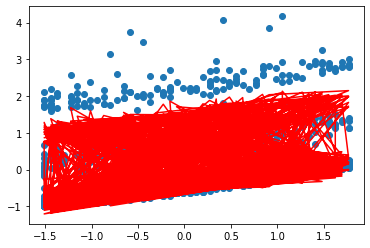

Streaming output truncated to the last 5000 lines.
[-0.52404841]
[-0.86032158]
[-1.58624807]
[-2.90522542]
[-2.3700076]
[-2.20507014]
[-1.7092164]
[-1.85754707]
[-1.71116646]
[-1.49326438]
[-0.79108335]
[-0.79223196]
[-0.90335059]
[-0.79440869]
[-0.72964177]
[-0.70951795]
[-0.46219494]
[-0.36730874]
[-0.59676347]
[-0.77791938]
[-0.5691128]
[-1.18170719]
[-0.93279745]
[-0.27477809]
[0.41352526]
[-0.28015693]
[-0.3470805]
[-1.38974702]
[-0.61062392]
[-1.2650475]
[-1.93202668]
[-1.42501779]
[-1.46789486]
[-1.21674978]
[-0.94078871]
[-2.57947629]
[-2.61794062]
[-2.49820613]
[-2.23136743]
[-1.93559904]
[-1.74987394]
[-1.5737257]
[-1.41480209]
[-1.475772]
[-1.24181232]
[-2.28864576]
[-2.4296157]
[-2.12571414]
[-2.27335505]
[-1.63124329]
[-1.596358]
[-1.38080472]
[-1.42251878]
[-1.14968835]
[-1.12131407]
[-1.17058028]
[-1.19989655]
[-0.98131352]
[-1.15227466]
[-0.39470133]
[0.39022787]
[0.36778837]
[0.60423055]
[0.90548784]
[1.16932195]
[1.91770289]
[2.1553832]
[2.67055934]
[1.88282004]
[1.11

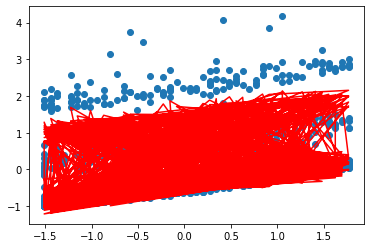

Streaming output truncated to the last 5000 lines.
[-0.45890365]
[-0.79689575]
[-1.52489877]
[-2.84567776]
[-2.3109042]
[-2.14672496]
[-1.65310603]
[-1.80460484]
[-1.65831147]
[-1.44275173]
[-0.73744488]
[-0.74142276]
[-0.85537353]
[-0.74657633]
[-0.68131817]
[-0.66190113]
[-0.41543628]
[-0.32350476]
[-0.55267126]
[-0.73398909]
[-0.52565798]
[-1.13461346]
[-0.88867933]
[-0.22610515]
[0.46747995]
[-0.22206217]
[-0.28783586]
[-1.33068961]
[-0.54756979]
[-1.19607512]
[-1.86365546]
[-1.35718193]
[-1.40178137]
[-1.15386113]
[-0.87719133]
[-2.51674153]
[-2.55721782]
[-2.43906472]
[-2.17277066]
[-1.87856827]
[-1.69374179]
[-1.51842965]
[-1.35973014]
[-1.42224234]
[-1.18904511]
[-2.2389299]
[-2.38053251]
[-2.07871435]
[-2.22752464]
[-1.58562421]
[-1.54950425]
[-1.33441816]
[-1.37940967]
[-1.10601329]
[-1.079561]
[-1.13005205]
[-1.16178118]
[-0.94552754]
[-1.1200268]
[-0.35718216]
[0.4316279]
[0.40587394]
[0.64060782]
[0.94136558]
[1.2044619]
[1.95725019]
[2.19536071]
[2.71774586]
[1.93649251]


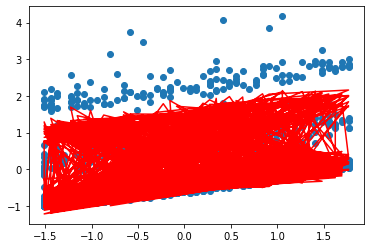

Streaming output truncated to the last 5000 lines.
[-0.39684363]
[-0.73647851]
[-1.466452]
[-2.7889566]
[-2.25462795]
[-2.09117784]
[-1.59969979]
[-1.75419959]
[-1.60798142]
[-1.3946657]
[-0.68637235]
[-0.69303769]
[-0.80967501]
[-0.70100456]
[-0.63527345]
[-0.61651387]
[-0.37087193]
[-0.28176421]
[-0.51063447]
[-0.69208893]
[-0.48420054]
[-1.08970939]
[-0.84661705]
[-0.17968782]
[0.51893472]
[-0.16667858]
[-0.23134752]
[-1.27439076]
[-0.48745077]
[-1.13032648]
[-1.79848858]
[-1.29252595]
[-1.33876998]
[-1.09393313]
[-0.81658332]
[-2.45695749]
[-2.49932745]
[-2.38266912]
[-2.11691004]
[-1.82418402]
[-1.64022017]
[-1.46571114]
[-1.30721709]
[-1.37119266]
[-1.13872447]
[-2.19152203]
[-2.33374155]
[-2.03390033]
[-2.18381311]
[-1.54213282]
[-1.50482156]
[-1.29018882]
[-1.3383071]
[-1.06436717]
[-1.03973155]
[-1.09138172]
[-1.12541839]
[-0.91139232]
[-1.08925336]
[-0.32137416]
[0.47114616]
[0.44221651]
[0.67533968]
[0.97562675]
[1.23801073]
[1.99499997]
[2.23350495]
[2.76277191]
[1.98768306

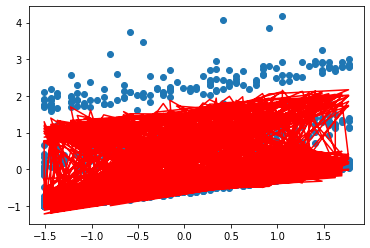

Streaming output truncated to the last 5000 lines.
[-0.33772174]
[-0.67892659]
[-1.41076985]
[-2.73492718]
[-2.20104281]
[-2.03829386]
[-1.54886652]
[-1.70620904]
[-1.56005502]
[-1.34888902]
[-0.63774233]
[-0.64696046]
[-0.76614629]
[-0.65758609]
[-0.59139971]
[-0.57325147]
[-0.32839863]
[-0.24198958]
[-0.4705572]
[-0.65212519]
[-0.44464884]
[-1.04689312]
[-0.80651474]
[-0.13542157]
[0.56800538]
[-0.11387943]
[-0.17748711]
[-1.2207214]
[-0.43013015]
[-1.0676507]
[-1.73637562]
[-1.23090045]
[-1.27871483]
[-1.03682606]
[-0.75882375]
[-2.39998503]
[-2.4441373]
[-2.32889186]
[-2.06365768]
[-1.77232344]
[-1.58918764]
[-1.41544995]
[-1.25714401]
[-1.32250823]
[-1.09073704]
[-2.14631509]
[-2.28913578]
[-1.99117046]
[-2.14212265]
[-1.50066979]
[-1.46220933]
[-1.24801637]
[-1.2991177]
[-1.02465574]
[-1.00173725]
[-1.05448435]
[-1.09072786]
[-0.87883197]
[-1.05988739]
[-0.28719987]
[0.50886745]
[0.47689522]
[0.70849977]
[1.00834338]
[1.27003978]
[2.03103326]
[2.26989951]
[2.80573585]
[2.03650612

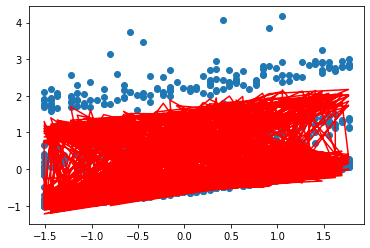

Streaming output truncated to the last 5000 lines.
[-0.28139835]
[-0.62410356]
[-1.35772101]
[-2.6834612]
[-2.15001938]
[-1.98794461]
[-1.50048144]
[-1.66051685]
[-1.51441683]
[-1.30531009]
[-0.59143733]
[-0.6030804]
[-0.72468387]
[-0.61621875]
[-0.54959416]
[-0.53201419]
[-0.28791798]
[-0.20408801]
[-0.43234803]
[-0.61400847]
[-0.40691542]
[-1.00606751]
[-0.76828098]
[-0.09320672]
[0.6148024]
[-0.06354393]
[-0.12613225]
[-1.16955853]
[-0.37547758]
[-1.00790398]
[-1.6771732]
[-1.17216304]
[-1.22147696]
[-0.98240678]
[-0.70377836]
[-2.34569161]
[-2.39152131]
[-2.27761138]
[-2.0128917]
[-1.72286942]
[-1.54052838]
[-1.36753146]
[-1.20939752]
[-1.27607958]
[-1.04497472]
[-2.10320695]
[-2.24661315]
[-1.9504278]
[-2.10235993]
[-1.46114042]
[-1.42157161]
[-1.2078051]
[-1.26175243]
[-0.98678912]
[-0.96549368]
[-1.01927888]
[-1.05763295]
[-0.84777405]
[-1.03186497]
[-0.2545853]
[0.5448728]
[0.50998561]
[0.74015845]
[1.03958434]
[1.30061723]
[2.06542746]
[2.30462418]
[2.8467316]
[2.08307087]
[1.

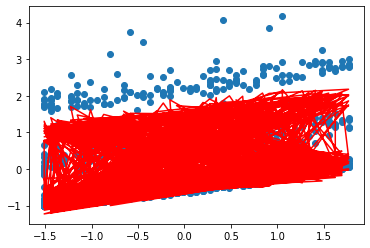

Streaming output truncated to the last 5000 lines.
[-0.22774049]
[-0.57187949]
[-1.30718042]
[-2.6344365]
[-2.10143448]
[-1.94000792]
[-1.45442589]
[-1.61701232]
[-1.47095699]
[-1.26382275]
[-0.54734557]
[-0.56129216]
[-0.68518922]
[-0.57680524]
[-0.50975891]
[-0.49270695]
[-0.24933624]
[-0.16797104]
[-0.39591981]
[-0.57765349]
[-0.37091684]
[-0.96713997]
[-0.73182863]
[-0.05294818]
[0.65943111]
[-0.01555693]
[-0.07716626]
[-1.12078489]
[-0.3233688]
[-0.95094926]
[-1.62074472]
[-1.11617803]
[-1.16692396]
[-0.93054846]
[-0.65131925]
[-2.29395093]
[-2.34135931]
[-2.22871174]
[-1.96449589]
[-1.67571023]
[-1.494132]
[-1.32184643]
[-1.16386948]
[-1.23180232]
[-1.00133439]
[-2.06210024]
[-2.20607637]
[-1.91157996]
[-2.06443595]
[-1.42345445]
[-1.38281691]
[-1.16946378]
[-1.22612642]
[-0.95068161]
[-0.93092031]
[-0.98568796]
[-1.0260605]
[-0.81814944]
[-1.00512504]
[-0.22345976]
[0.57923963]
[0.54155989]
[0.770383]
[1.06941548]
[1.32980823]
[2.09825653]
[2.33775514]
[2.88584885]
[2.12748147]


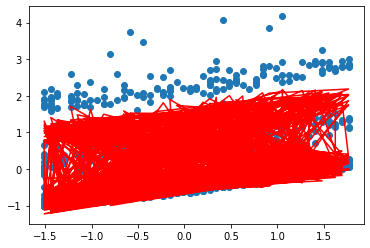

Streaming output truncated to the last 5000 lines.
[-0.17662155]
[-0.52213071]
[-1.25902899]
[-2.58773677]
[-2.0551709]
[-1.89436754]
[-1.41058698]
[-1.57559011]
[-1.42957094]
[-1.22432601]
[-0.50536069]
[-0.52149548]
[-0.6475685]
[-0.53925288]
[-0.47180072]
[-0.45523919]
[-0.21256408]
[-0.13355438]
[-0.36118946]
[-0.54297891]
[-0.33657348]
[-0.9300222]
[-0.6970746]
[-0.0145553]
[0.70199198]
[0.03019131]
[-0.03047788]
[-1.07428872]
[-0.27368531]
[-0.89665589]
[-1.56695998]
[-1.06281615]
[-1.11492961]
[-0.88113028]
[-0.60132454]
[-2.24464268]
[-2.29353674]
[-2.18208241]
[-1.91835948]
[-1.63073937]
[-1.44989319]
[-1.27829069]
[-1.12045679]
[-1.18957687]
[-0.95971771]
[-2.02290208]
[-2.16743271]
[-1.8745388]
[-2.02826578]
[-1.38752583]
[-1.34585795]
[-1.13290541]
[-1.19215872]
[-0.91625147]
[-0.89794029]
[-0.95363774]
[-0.99594069]
[-0.7898922]
[-0.97960932]
[-0.19375577]
[0.6120419]
[0.57168696]
[0.79923773]
[1.09789975]
[1.35767508]
[2.12959112]
[2.36936512]
[2.9231732]
[2.16983729]
[1.

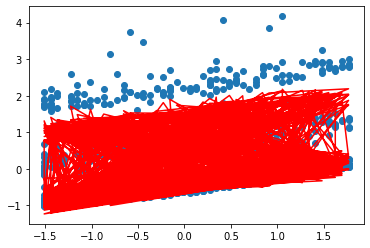

Streaming output truncated to the last 5000 lines.
[-0.12792094]
[-0.47473942]
[-1.21315331]
[-2.54325125]
[-2.01111712]
[-1.85091285]
[-1.36885734]
[-1.53614998]
[-1.39015919]
[-1.18672377]
[-0.46538144]
[-0.48359494]
[-0.61173238]
[-0.50347343]
[-0.43563079]
[-0.41952458]
[-0.17751639]
[-0.10075774]
[-0.32807775]
[-0.50990712]
[-0.30380935]
[-0.89463]
[-0.66393971]
[0.0220584]
[0.74258081]
[0.07380543]
[0.01403894]
[-1.02996351]
[-0.22631415]
[-0.84489935]
[-1.51569489]
[-1.0119542]
[-1.06537369]
[-0.83403713]
[-0.55367813]
[-2.19765222]
[-2.24794441]
[-2.13761797]
[-1.87437691]
[-1.58785526]
[-1.40771159]
[-1.23676492]
[-1.07906114]
[-1.14930826]
[-0.92003088]
[-1.9855239]
[-2.13059374]
[-1.83922031]
[-1.99376843]
[-1.35327252]
[-1.31061152]
[-1.09804705]
[-1.15977216]
[-0.88342078]
[-0.8664803]
[-0.92305773]
[-0.9672069]
[-0.76293938]
[-0.95526212]
[-0.16540884]
[0.64335028]
[0.60043268]
[0.82678409]
[1.12509733]
[1.38427727]
[2.15949874]
[2.39952358]
[2.95878641]
[2.21023314]
[1.4

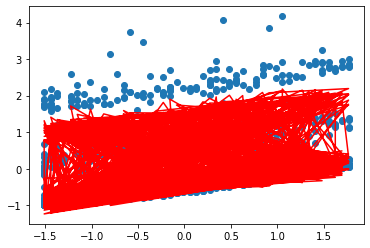

Streaming output truncated to the last 5000 lines.
[-0.08152384]
[-0.42959346]
[-1.16944538]
[-2.50087452]
[-1.96916699]
[-1.80953862]
[-1.32913485]
[-1.49859656]
[-1.35262702]
[-1.15092462]
[-0.42731148]
[-0.44749972]
[-0.57759584]
[-0.46938284]
[-0.40116452]
[-0.38548086]
[-0.14411208]
[-0.06950465]
[-0.2965092]
[-0.4783641]
[-0.27255195]
[-0.86088311]
[-0.63234844]
[0.05697537]
[0.781289]
[0.11538513]
[0.05648531]
[-0.98770772]
[-0.18114762]
[-0.79556094]
[-1.46683121]
[-0.96347477]
[-1.01814161]
[-0.78915934]
[-0.5082694]
[-2.15287034]
[-2.20447822]
[-2.09521791]
[-1.8324475]
[-1.54696103]
[-1.36749147]
[-1.19717447]
[-1.03958879]
[-1.11090588]
[-0.88218447]
[-1.94988124]
[-2.09547516]
[-1.80554436]
[-1.96086664]
[-1.32061633]
[-1.27699826]
[-1.06480961]
[-1.12889315]
[-0.85211522]
[-0.83647039]
[-0.89388068]
[-0.93979554]
[-0.73723096]
[-0.93203028]
[-0.13835741]
[0.67323227]
[0.62785989]
[0.85308083]
[1.15106576]
[1.40967169]
[2.18804386]
[2.42829679]
[2.99276651]
[2.24875947]
[1

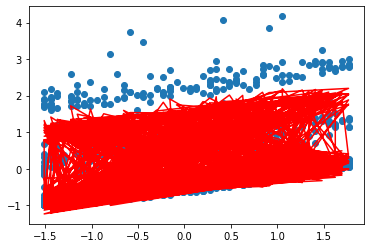

Streaming output truncated to the last 5000 lines.
[-0.03732089]
[-0.38658605]
[-1.12780235]
[-2.46050617]
[-1.92921949]
[-1.77014468]
[-1.29132233]
[-1.46283907]
[-1.31688431]
[-1.11684158]
[-0.39105915]
[-0.41312336]
[-0.54507789]
[-0.43690106]
[-0.36832136]
[-0.35302966]
[-0.11227388]
[-0.03972225]
[-0.26641181]
[-0.44827926]
[-0.24273211]
[-0.82870499]
[-0.60222881]
[0.09027425]
[0.81820368]
[0.15502547]
[0.09695766]
[-0.94742457]
[-0.13808304]
[-0.74852753]
[-1.42025626]
[-0.91726599]
[-0.97312417]
[-0.74639243]
[-0.46499297]
[-2.11019298]
[-2.16303891]
[-2.05478635]
[-1.79247533]
[-1.50796433]
[-1.32914158]
[-1.15942906]
[-1.00195033]
[-1.07428334]
[-0.84609317]
[-1.91589356]
[-2.06199664]
[-1.77343456]
[-1.92948668]
[-1.28948271]
[-1.24494248]
[-1.03311768]
[-1.09945152]
[-0.82226393]
[-0.80784382]
[-0.86604238]
[-0.91364592]
[-0.71270964]
[-0.90986302]
[-0.11254265]
[0.70175235]
[0.65402865]
[0.87818409]
[1.17586004]
[1.43391268]
[2.2152881]
[2.45574806]
[3.02518803]
[2.2855025

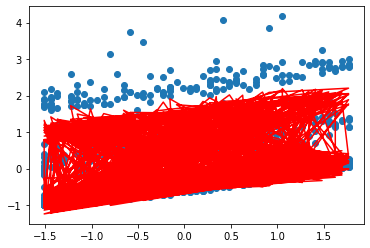

Streaming output truncated to the last 5000 lines.
[0.00479205]
[-0.34561548]
[-1.08812626]
[-2.42205061]
[-1.89117849]
[-1.73263574]
[-1.25532738]
[-1.42879115]
[-1.28284528]
[-1.0843919]
[-0.35653716]
[-0.38038357]
[-0.51410144]
[-0.40595186]
[-0.33702457]
[-0.32209627]
[-0.08192817]
[-0.01134111]
[-0.23771695]
[-0.41958524]
[-0.21428381]
[-0.79802268]
[-0.57351221]
[0.12203005]
[0.85340795]
[0.19281707]
[0.13554788]
[-0.90902183]
[-0.09702251]
[-0.70369129]
[-1.37586264]
[-0.87322125]
[-0.93021733]
[-0.70563686]
[-0.42374841]
[-2.06952099]
[-2.12353189]
[-2.0162319]
[-1.75436894]
[-1.47077706]
[-1.2925749]
[-1.12344265]
[-0.96606054]
[-1.03935822]
[-0.81167561]
[-1.88348403]
[-2.03008156]
[-1.74281808]
[-1.89955826]
[-1.2598006]
[-1.21437199]
[-1.00289936]
[-1.07138038]
[-0.79379936]
[-0.78053692]
[-0.83948156]
[-0.88870015]
[-0.68932076]
[-0.88871187]
[-0.08790842]
[0.72897215]
[0.67899627]
[0.90214753]
[1.19953273]
[1.45705218]
[2.24129029]
[2.4819378]
[3.05612208]
[2.32054475]
[1

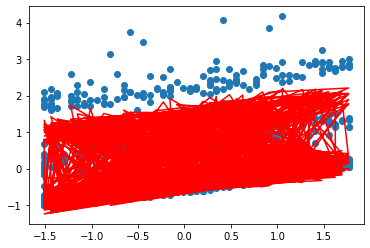

Streaming output truncated to the last 5000 lines.
[0.04491416]
[-0.30658491]
[-1.05032384]
[-2.38541681]
[-1.85495249]
[-1.6969211]
[-1.22106207]
[-1.39637061]
[-1.25042826]
[-1.05349682]
[-0.3236625]
[-0.34920204]
[-0.48459308]
[-0.37646263]
[-0.30720104]
[-0.29260952]
[-0.05300477]
[0.01570488]
[-0.21035922]
[-0.39221779]
[-0.18714406]
[-0.76876658]
[-0.54613322]
[0.15231429]
[0.88698109]
[0.22884629]
[0.17234361]
[-0.87241156]
[-0.0578727]
[-0.66094943]
[-1.33354802]
[-0.83123897]
[-0.88932193]
[-0.66679779]
[-0.38444006]
[-2.0307599]
[-2.08586697]
[-1.9794674]
[-1.71804115]
[-1.43531523]
[-1.25770847]
[-1.08913321]
[-0.93183814]
[-1.00605192]
[-0.7788542]
[-1.8525794]
[-1.99965691]
[-1.71362544]
[-1.8710143]
[-1.23150225]
[-1.18521797]
[-0.9740861]
[-1.04461594]
[-0.76665706]
[-0.75448893]
[-0.81413974]
[-0.86490297]
[-0.66701216]
[-0.86853054]
[-0.06440107]
[0.75495049]
[0.70281751]
[0.92502241]
[1.22213409]
[1.47913981]
[2.26610665]
[2.50692368]
[3.08563659]
[2.35396457]
[1.6377

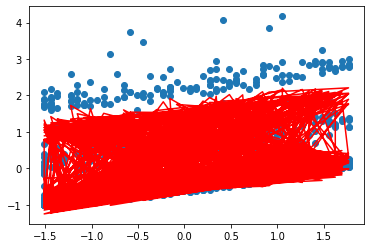

Streaming output truncated to the last 5000 lines.
[0.08313991]
[-0.26940213]
[-1.01430624]
[-2.35051811]
[-1.82045443]
[-1.66291446]
[-1.18844278]
[-1.36549923]
[-1.21955557]
[-1.02408144]
[-0.29235612]
[-0.31950421]
[-0.45648292]
[-0.34836422]
[-0.27878116]
[-0.26450156]
[-0.02543686]
[0.04147872]
[-0.18427624]
[-0.36611564]
[-0.16125276]
[-0.74087037]
[-0.52002945]
[0.18119517]
[0.91899866]
[0.26319545]
[0.2074284]
[-0.83750996]
[-0.02054462]
[-0.62020399]
[-1.29321487]
[-0.79122234]
[-0.85034349]
[-0.62978486]
[-0.34697676]
[-1.99381973]
[-2.04995817]
[-1.94440971]
[-1.68340884]
[-1.40149875]
[-1.22446318]
[-1.05642252]
[-0.89920563]
[-0.97428947]
[-0.74755494]
[-1.82310982]
[-1.97065305]
[-1.68579043]
[-1.84379084]
[-1.20452309]
[-1.15741476]
[-0.94661252]
[-1.01909737]
[-0.74077561]
[-0.7296419]
[-0.78996112]
[-0.84220163]
[-0.64573408]
[-0.84927483]
[-0.04196938]
[0.77974359]
[0.72554462]
[0.94685774]
[1.24371214]
[1.50022298]
[2.28979087]
[2.53076077]
[3.11379638]
[2.38583693]


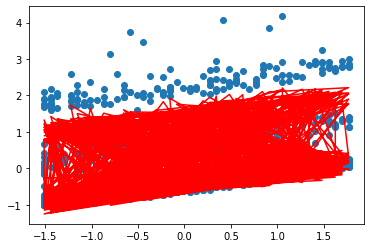

Streaming output truncated to the last 5000 lines.
[0.11955924]
[-0.23397933]
[-0.97998885]
[-2.31727197]
[-1.78760144]
[-1.63053371]
[-1.15738992]
[-1.33610258]
[-1.19015321]
[-0.99607447]
[-0.26254281]
[-0.29121911]
[-0.42970441]
[-0.32159078]
[-0.2516986]
[-0.23770776]
[0.00083927]
[0.06604042]
[-0.15940855]
[-0.34122032]
[-0.13655256]
[-0.71427078]
[-0.49514147]
[0.20873774]
[0.94953277]
[0.29594304]
[0.24088189]
[-0.80423716]
[0.01504657]
[-0.58136158]
[-1.25477022]
[-0.7530791]
[-0.81319198]
[-0.59451201]
[-0.31127166]
[-1.95861472]
[-2.01572353]
[-1.91097959]
[-1.65039282]
[-1.36925124]
[-1.1927636]
[-1.02523603]
[-0.86808911]
[-0.94399936]
[-0.71770727]
[-1.79500866]
[-1.94300363]
[-1.65924989]
[-1.81782684]
[-1.17880155]
[-1.13089976]
[-0.92041631]
[-0.99476668]
[-0.71609641]
[-0.70594053]
[-0.76689242]
[-0.82054582]
[-0.62543904]
[-0.83090255]
[-0.02056444]
[0.80340515]
[0.74722753]
[0.96770033]
[1.26431279]
[1.520347]
[2.31239424]
[2.55350161]
[3.14066334]
[2.41623332]
[1.70

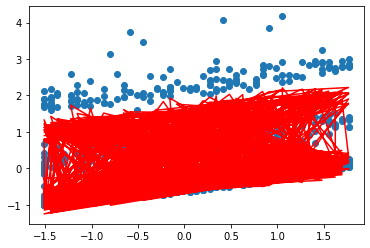

Streaming output truncated to the last 5000 lines.
[0.15425782]
[-0.20023288]
[-0.9472911]
[-2.28559982]
[-1.75631463]
[-1.59970068]
[-1.12782782]
[-1.30810982]
[-1.16215081]
[-0.96940808]
[-0.23415097]
[-0.26427919]
[-0.40419419]
[-0.29607957]
[-0.22589019]
[-0.2121665]
[0.02588431]
[0.08944715]
[-0.13569949]
[-0.31747609]
[-0.11298875]
[-0.68890752]
[-0.47141259]
[0.23500403]
[0.97865215]
[0.32716385]
[0.27278002]
[-0.772517]
[0.04898176]
[-0.54433319]
[-1.21812551]
[-0.71672133]
[-0.77778159]
[-0.56089721]
[-0.27724202]
[-1.92506316]
[-1.98308493]
[-1.87910145]
[-1.61891755]
[-1.33849987]
[-1.16253782]
[-0.99550266]
[-0.83841812]
[-0.9151134]
[-0.68924388]
[-1.7682124]
[-1.91664538]
[-1.63394361]
[-1.7930641]
[-1.15427894]
[-1.10561327]
[-0.89543805]
[-0.97156858]
[-0.6925636]
[-0.68333206]
[-0.74488282]
[-0.79988752]
[-0.60608175]
[-0.81337339]
[-0.00013955]
[0.82598643]
[0.76791389]
[0.98759493]
[1.28397991]
[1.53955515]
[2.33396575]
[2.57519638]
[3.16629654]
[2.44522192]
[1.73943

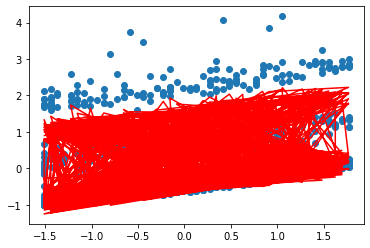

Streaming output truncated to the last 5000 lines.
[0.18731725]
[-0.16808314]
[-0.91613623]
[-2.25542682]
[-1.72651894]
[-1.57034101]
[-1.09968446]
[-1.28145355]
[-1.13548134]
[-0.94401773]
[-0.20711248]
[-0.23862015]
[-0.37989192]
[-0.27177085]
[-0.20129576]
[-0.18781909]
[0.0497561]
[0.1117534]
[-0.113095]
[-0.29482976]
[-0.09050911]
[-0.66472307]
[-0.44878877]
[0.26005321]
[1.00642237]
[0.3569292]
[0.30319521]
[-0.74227691]
[0.08133807]
[-0.50903399]
[-1.18319631]
[-0.68206527]
[-0.74403056]
[-0.52886232]
[-0.244809]
[-1.89308722]
[-1.95196788]
[-1.84870322]
[-1.58891106]
[-1.30917518]
[-1.13371727]
[-0.96715464]
[-0.81012547]
[-0.88756653]
[-0.66210058]
[-1.74266046]
[-1.89151799]
[-1.60981418]
[-1.7694471]
[-1.13089931]
[-1.08149836]
[-0.87162107]
[-0.94945035]
[-0.67012393]
[-0.66176617]
[-0.72388381]
[-0.7801809]
[-0.58761897]
[-0.79664889]
[0.0193499]
[0.84753643]
[0.7876492]
[1.00658427]
[1.30275543]
[1.55788878]
[2.35455217]
[2.59589297]
[3.19075239]
[2.47286778]
[1.77022353]

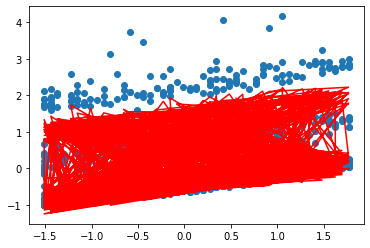

Streaming output truncated to the last 5000 lines.
[0.21881524]
[-0.13745429]
[-0.88645115]
[-2.22668172]
[-1.69814292]
[-1.54238391]
[-1.07289133]
[-1.2560696]
[-1.11008101]
[-0.919842]
[-0.18136248]
[-0.21418077]
[-0.35674016]
[-0.24860772]
[-0.17785798]
[-0.16460956]
[0.07250974]
[0.13301104]
[-0.09154358]
[-0.2732306]
[-0.06906383]
[-0.64166261]
[-0.42721849]
[0.28394168]
[1.03290595]
[0.38530705]
[0.33219648]
[-0.71344771]
[0.11218902]
[-0.47538311]
[-1.14990216]
[-0.64903107]
[-0.71186097]
[-0.49833291]
[-0.21389747]
[-1.86261271]
[-1.92230138]
[-1.81971617]
[-1.56030474]
[-1.28121095]
[-1.10623658]
[-0.94012737]
[-0.78314709]
[-0.86129673]
[-0.63621617]
[-1.71829506]
[-1.86756396]
[-1.58680685]
[-1.74692288]
[-1.10860934]
[-1.05850071]
[-0.84891135]
[-0.92836172]
[-0.6487266]
[-0.64119482]
[-0.70384908]
[-0.76138224]
[-0.57000949]
[-0.78069232]
[0.0379465]
[0.86810192]
[0.8064769]
[1.0247092]
[1.32067941]
[1.57538739]
[2.37419819]
[2.61563708]
[3.21408471]
[2.49923293]
[1.799576

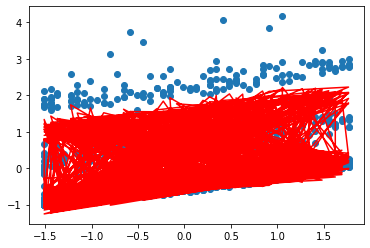

Streaming output truncated to the last 5000 lines.
[0.2488258]
[-0.1082741]
[-0.85816625]
[-2.19929665]
[-1.67111857]
[-1.51576203]
[-1.04738325]
[-1.23189691]
[-1.08588912]
[-0.89682245]
[-0.15683923]
[-0.19090279]
[-0.33468419]
[-0.22653598]
[-0.15552225]
[-0.14248461]
[0.09419776]
[0.15326952]
[-0.07099611]
[-0.25263021]
[-0.04860538]
[-0.61967386]
[-0.40665265]
[0.30672325]
[1.05816252]
[0.41236219]
[0.35984964]
[-0.68596347]
[0.14160472]
[-0.44330347]
[-1.1181664]
[-0.61754265]
[-0.68119857]
[-0.46923803]
[-0.18443585]
[-1.83356896]
[-1.89401773]
[-1.79207478]
[-1.53303316]
[-1.25454403]
[-1.0800334]
[-0.91435925]
[-0.75742191]
[-0.83624482]
[-0.61153226]
[-1.69506111]
[-1.84472847]
[-1.56486943]
[-1.72544091]
[-1.08735817]
[-1.03656856]
[-0.82725738]
[-0.90825475]
[-0.62832318]
[-0.62157221]
[-0.68473446]
[-0.74344981]
[-0.55321396]
[-0.76546862]
[0.0556909]
[0.88772758]
[0.82443847]
[1.04200874]
[1.33779014]
[1.59208872]
[2.39294649]
[2.63447235]
[3.2363449]
[2.52437658]
[1.8275

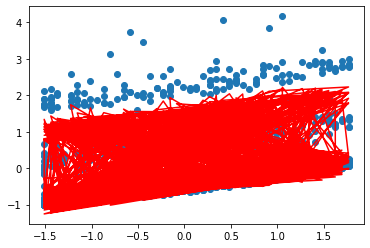

Streaming output truncated to the last 5000 lines.
[0.27741942]
[-0.0804738]
[-0.83121523]
[-2.17320702]
[-1.64538116]
[-1.49041126]
[-1.02309822]
[-1.20887737]
[-1.06284786]
[-0.87490348]
[-0.13348401]
[-0.16873073]
[-0.31367192]
[-0.20550399]
[-0.13423655]
[-0.12139342]
[0.11487019]
[0.17257594]
[-0.0514058]
[-0.23298246]
[-0.0290884]
[-0.59870699]
[-0.38704441]
[0.32844923]
[1.08224894]
[0.43815639]
[0.38621744]
[-0.65976132]
[0.16965199]
[-0.41272159]
[-1.08791594]
[-0.5875275]
[-0.65197261]
[-0.44151013]
[-0.15635596]
[-1.80588865]
[-1.86705242]
[-1.76571654]
[-1.50703398]
[-1.22911419]
[-1.0550483]
[-0.88979158]
[-0.73289166]
[-0.81235437]
[-0.58799318]
[-1.67290607]
[-1.82295929]
[-1.54395214]
[-1.70495302]
[-1.06709734]
[-1.01565251]
[-0.80661005]
[-0.88908376]
[-0.60886748]
[-0.60285464]
[-0.66649778]
[-0.72634381]
[-0.53719484]
[-0.75094432]
[0.07262193]
[0.90645608]
[0.8415735]
[1.05852018]
[1.35412421]
[1.60802883]
[2.41083782]
[2.65244042]
[3.257582]
[2.54835519]
[1.854238

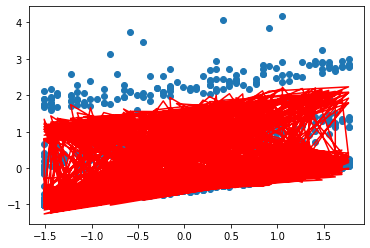

Streaming output truncated to the last 5000 lines.
[0.30466323]
[-0.05398789]
[-0.80553493]
[-2.14835128]
[-1.62086907]
[-1.46627059]
[-0.99997723]
[-1.18695568]
[-1.04090223]
[-0.85403216]
[-0.11124087]
[-0.14761179]
[-0.29365376]
[-0.1854626]
[-0.11395134]
[-0.10128755]
[0.13457471]
[0.19097517]
[-0.03272799]
[-0.2142433]
[-0.01046962]
[-0.57871446]
[-0.36834915]
[0.34916855]
[1.10521945]
[0.46274851]
[0.4113597]
[-0.63478136]
[0.19639455]
[-0.38356745]
[-1.05908116]
[-0.55891654]
[-0.62411566]
[-0.41508479]
[-0.1295928]
[-1.7795076]
[-1.84134392]
[-1.74058187]
[-1.48224777]
[-1.20486401]
[-1.03122461]
[-0.86636837]
[-0.70950081]
[-0.78957157]
[-0.56554585]
[-1.65177985]
[-1.8022066]
[-1.52400754]
[-1.68541324]
[-1.04778065]
[-0.99570549]
[-0.78692254]
[-0.87080516]
[-0.59031547]
[-0.58500041]
[-0.6490988]
[-0.71002624]
[-0.52191634]
[-0.73708744]
[0.08877668]
[0.92432817]
[0.85791979]
[1.07427912]
[1.36971658]
[1.62324214]
[2.42791111]
[2.66958103]
[3.27784284]
[2.57122262]
[1.87967

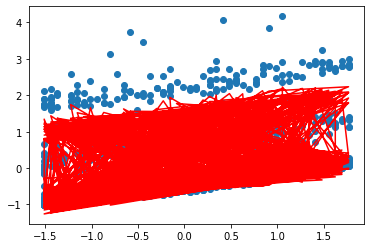

Streaming output truncated to the last 5000 lines.
[0.33062117]
[-0.028754]
[-0.78106521]
[-2.12467085]
[-1.59752367]
[-1.44328196]
[-0.97796415]
[-1.1660792]
[-1.01999985]
[-0.83415813]
[-0.09005659]
[-0.12749569]
[-0.27458246]
[-0.16636495]
[-0.09461941]
[-0.08212087]
[0.15335676]
[0.20850996]
[-0.01492014]
[-0.19637075]
[0.00729225]
[-0.55965097]
[-0.35052432]
[0.36892787]
[1.12712576]
[0.48619468]
[0.43533345]
[-0.61096649]
[0.22189315]
[-0.35577429]
[-1.03159567]
[-0.5316439]
[-0.59756346]
[-0.38990069]
[-0.10408446]
[-1.75436469]
[-1.8168336]
[-1.71661395]
[-1.45861787]
[-1.18173872]
[-1.0085083]
[-0.84403626]
[-0.6871964]
[-0.76784509]
[-0.54413962]
[-1.63163466]
[-1.78242291]
[-1.50499036]
[-1.66677772]
[-1.02936404]
[-0.97668256]
[-0.76815019]
[-0.85337741]
[-0.57262516]
[-0.56796974]
[-0.63249912]
[-0.69446085]
[-0.50734429]
[-0.7238675]
[0.10419052]
[0.94138276]
[0.87351343]
[1.08931959]
[1.38460065]
[1.63776157]
[2.44420352]
[2.68593213]
[3.29717211]
[2.59303025]
[1.9039204

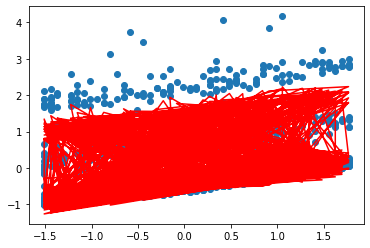

Streaming output truncated to the last 5000 lines.
[0.35535414]
[-0.00471272]
[-0.75774878]
[-2.10210991]
[-1.57528913]
[-1.4213901]
[-0.95700557]
[-1.14619783]
[-1.00009087]
[-0.81523348]
[-0.06988051]
[-0.10833458]
[-0.25641305]
[-0.14816645]
[-0.07619581]
[-0.06384938]
[0.17125965]
[0.22522104]
[0.00205831]
[-0.17932476]
[0.02423659]
[-0.5414733]
[-0.33352933]
[0.38777169]
[1.14801718]
[0.50854839]
[0.45819308]
[-0.58826226]
[0.24620572]
[-0.32927849]
[-1.00539623]
[-0.50564685]
[-0.57225477]
[-0.36589936]
[-0.07977194]
[-1.73040167]
[-1.79346555]
[-1.6937586]
[-1.43609026]
[-1.15968611]
[-0.98684785]
[-0.82274437]
[-0.66592794]
[-0.74712597]
[-0.52372622]
[-1.61242496]
[-1.76356297]
[-1.48685748]
[-1.64900466]
[-1.01180553]
[-0.95854092]
[-0.75025043]
[-0.83676091]
[-0.55575651]
[-0.55172468]
[-0.61666211]
[-0.67961306]
[-0.49344609]
[-0.71125536]
[0.11889726]
[0.95765701]
[0.88838886]
[1.10367409]
[1.39880835]
[1.65161852]
[2.45975056]
[2.70152992]
[3.31561245]
[2.61382709]
[1.927

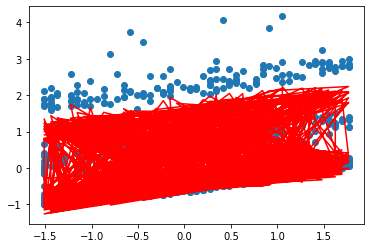

Streaming output truncated to the last 5000 lines.
[0.37892016]
[0.01819252]
[-0.73553107]
[-2.08061534]
[-1.55411232]
[-1.40054241]
[-0.93705068]
[-1.12726387]
[-0.98112784]
[-0.79721259]
[-0.05066439]
[-0.09008289]
[-0.2391027]
[-0.1308246]
[-0.05863768]
[-0.04643117]
[0.18832464]
[0.24114723]
[0.01824602]
[-0.16306711]
[0.04040099]
[-0.52414028]
[-0.31732552]
[0.40574244]
[1.16794076]
[0.52986064]
[0.47999043]
[-0.56661679]
[0.26938748]
[-0.30401939]
[-0.98042255]
[-0.48086557]
[-0.54813125]
[-0.34302513]
[-0.05659904]
[-1.70756303]
[-1.77118648]
[-1.67196414]
[-1.41461346]
[-1.13865639]
[-0.96619414]
[-0.80244419]
[-0.64564726]
[-0.72736753]
[-0.50425959]
[-1.5941073]
[-1.74558361]
[-1.46956775]
[-1.63205417]
[-0.99506509]
[-0.9412397]
[-0.73318268]
[-0.82091787]
[-0.53967135]
[-0.53622903]
[-0.60155278]
[-0.66544986]
[-0.48019067]
[-0.69922322]
[0.13292915]
[0.97318642]
[0.90257898]
[1.11737367]
[1.41237016]
[1.66484302]
[2.47458611]
[2.71640895]
[3.3332046]
[2.63365989]
[1.949075

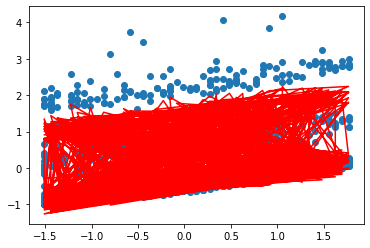

Streaming output truncated to the last 5000 lines.
[0.40137448]
[0.0400156]
[-0.71436011]
[-2.06013653]
[-1.53394266]
[-1.38068884]
[-0.91805111]
[-1.10923195]
[-0.96306559]
[-0.78005206]
[-0.03236233]
[-0.07269725]
[-0.22261061]
[-0.11429891]
[-0.04190424]
[-0.02982629]
[0.20459103]
[0.25632549]
[0.03367988]
[-0.14756138]
[0.05582132]
[-0.50761261]
[-0.30187601]
[0.42288059]
[1.18694136]
[0.55018002]
[0.50077492]
[-0.54598062]
[0.29149107]
[-0.27993918]
[-0.95661719]
[-0.45724307]
[-0.52513727]
[-0.32122492]
[-0.03451217]
[-1.68579589]
[-1.74994559]
[-1.65118131]
[-1.39413841]
[-1.11860208]
[-0.94650034]
[-0.7830895]
[-0.62630848]
[-0.70852525]
[-0.48569582]
[-1.57664024]
[-1.72844371]
[-1.45308195]
[-1.61588821]
[-0.97910455]
[-0.92473997]
[-0.71690824]
[-0.8058123]
[-0.52433326]
[-0.52144826]
[-0.58713777]
[-0.65193976]
[-0.46754836]
[-0.68774454]
[0.14631701]
[0.98800486]
[0.91611518]
[1.13044799]
[1.42531523]
[1.67746372]
[2.48874254]
[2.73060222]
[3.34998739]
[2.65257324]
[1.9700

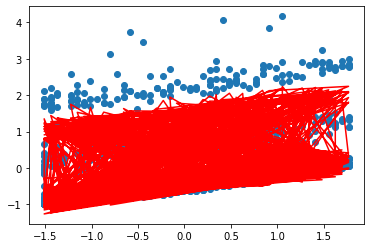

Streaming output truncated to the last 5000 lines.
[0.4227697]
[0.06080783]
[-0.69418639]
[-2.04062529]
[-1.514732]
[-1.36178174]
[-0.89996087]
[-1.09205887]
[-0.94586109]
[-0.76371059]
[-0.01493063]
[-0.05613637]
[-0.20689794]
[-0.09855083]
[-0.02595659]
[-0.01399666]
[0.22009631]
[0.27079104]
[0.04839501]
[-0.13277279]
[0.07053178]
[-0.49185285]
[-0.28714565]
[0.43922474]
[1.20506173]
[0.56955289]
[0.5205937]
[-0.5263066]
[0.31256668]
[-0.25698277]
[-0.93392539]
[-0.43472505]
[-0.50321985]
[-0.30044819]
[-0.01346032]
[-1.66504985]
[-1.72969445]
[-1.63136312]
[-1.3746183]
[-1.0994779]
[-0.9277218]
[-0.7646362]
[-0.60786779]
[-0.69055664]
[-0.46799305]
[-1.5599843]
[-1.71210404]
[-1.43736267]
[-1.60047049]
[-0.96388754]
[-0.90900458]
[-0.7013902]
[-0.79140986]
[-0.50970755]
[-0.50734942]
[-0.57338523]
[-0.63905271]
[-0.45549085]
[-0.676794]
[0.15909023]
[1.00214469]
[0.92902741]
[1.14292537]
[1.43767139]
[1.68950801]
[2.50225077]
[2.74414118]
[3.36599793]
[2.6706097]
[1.99011586]
[1.46

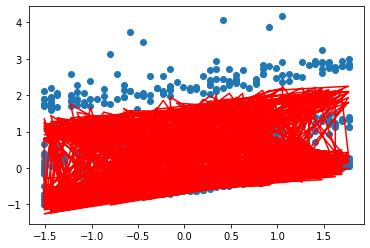

Streaming output truncated to the last 5000 lines.
[0.44315597]
[0.08061808]
[-0.67496276]
[-2.02203571]
[-1.49643451]
[-1.34377576]
[-0.88273617]
[-1.0757035]
[-0.92947342]
[-0.74814887]
[0.00167232]
[-0.04036092]
[-0.1919277]
[-0.08354364]
[-0.01075771]
[0.00109399]
[0.23487618]
[0.28457746]
[0.06242493]
[-0.11866821]
[0.08456502]
[-0.47682529]
[-0.27310093]
[0.45481169]
[1.22234269]
[0.58802342]
[0.53949168]
[-0.50754981]
[0.33266218]
[-0.23509762]
[-0.91229496]
[-0.41325974]
[-0.48232847]
[-0.28064675]
[0.00660517]
[-1.64527691]
[-1.71038689]
[-1.61246479]
[-1.35600856]
[-1.08124067]
[-0.90981593]
[-0.74704228]
[-0.59028347]
[-0.67342122]
[-0.45111132]
[-1.54410179]
[-1.69652724]
[-1.42237427]
[-1.58576639]
[-0.94937938]
[-0.89399809]
[-0.68659339]
[-0.77767782]
[-0.4957611]
[-0.49390106]
[-0.56026479]
[-0.62676005]
[-0.44399116]
[-0.6663474]
[0.1712769]
[1.01563682]
[0.94134429]
[1.15483288]
[1.44946523]
[1.70100205]
[2.51514029]
[2.75705589]
[3.3812716]
[2.68780982]
[2.00921157]


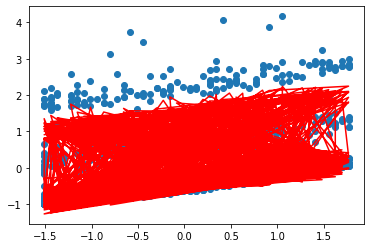

Streaming output truncated to the last 5000 lines.
[0.46258101]
[0.0994929]
[-0.65664431]
[-2.0043241]
[-1.47900657]
[-1.32662773]
[-0.86633536]
[-1.06012671]
[-0.91386359]
[-0.73332949]
[0.01748611]
[-0.02533347]
[-0.17766467]
[-0.06924235]
[0.00372768]
[0.01548027]
[0.24896467]
[0.29771671]
[0.07580159]
[-0.105216]
[0.09795219]
[-0.4624959]
[-0.2597099]
[0.46967654]
[1.23882313]
[0.6056337]
[0.55751171]
[-0.48966739]
[0.3518232]
[-0.21423367]
[-0.89167617]
[-0.39279781]
[-0.46241501]
[-0.26177472]
[0.02573062]
[-1.62643131]
[-1.69197888]
[-1.59444359]
[-1.33826666]
[-1.06384923]
[-0.89274215]
[-0.73026766]
[-0.57351572]
[-0.65708037]
[-0.43501255]
[-1.52895679]
[-1.68167765]
[-1.40808274]
[-1.57174292]
[-0.93554701]
[-0.87968674]
[-0.67248425]
[-0.76458495]
[-0.48246235]
[-0.48107322]
[-0.54774743]
[-0.61503442]
[-0.43302354]
[-0.65638168]
[0.1829038]
[1.02851073]
[0.9530931]
[1.16619635]
[1.46072215]
[1.71197079]
[2.52743929]
[2.76937502]
[3.3958422]
[2.70421231]
[2.02741641]
[1.506

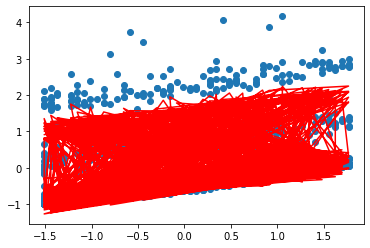

Streaming output truncated to the last 5000 lines.
[0.48109031]
[0.11747662]
[-0.63918825]
[-1.98744882]
[-1.46240664]
[-1.31029657]
[-0.85071879]
[-1.04529124]
[-0.8989945]
[-0.71921684]
[0.03254843]
[-0.01101839]
[-0.1640753]
[-0.05561362]
[0.01753321]
[0.02919511]
[0.26239419]
[0.31023926]
[0.08855542]
[-0.092386]
[0.11072299]
[-0.4488322]
[-0.2469421]
[0.48385276]
[1.25454015]
[0.62242387]
[0.57469463]
[-0.47261852]
[0.37009322]
[-0.1943432]
[-0.87202162]
[-0.37329224]
[-0.44343359]
[-0.24378836]
[0.04396021]
[-1.60846945]
[-1.67442848]
[-1.57725879]
[-1.32135209]
[-1.04726431]
[-0.87646174]
[-0.71427415]
[-0.55752658]
[-0.64149725]
[-0.41966043]
[-1.51451505]
[-1.66752132]
[-1.39445566]
[-1.55836858]
[-0.9223589]
[-0.8660383]
[-0.6590308]
[-0.75210151]
[-0.46978122]
[-0.46883728]
[-0.5358055]
[-0.60384973]
[-0.42256341]
[-0.6468748]
[0.19399652]
[1.04079461]
[0.96429992]
[1.17704047]
[1.47146642]
[1.72243809]
[2.53917467]
[2.78112591]
[3.40974196]
[2.7198541]
[2.04477193]
[1.52557

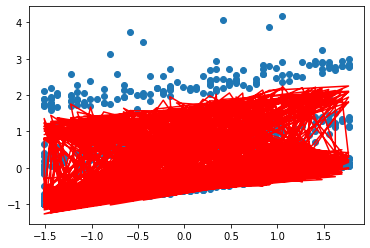

Streaming output truncated to the last 5000 lines.
[0.49872717]
[0.13461145]
[-0.62255383]
[-1.97137022]
[-1.44659518]
[-1.29474317]
[-0.83584875]
[-1.03116163]
[-0.88483083]
[-0.70577704]
[0.04689519]
[0.00261825]
[-0.15112763]
[-0.04262572]
[0.03069088]
[0.04226995]
[0.27519565]
[0.32217414]
[0.10071546]
[-0.08014946]
[0.12290579]
[-0.43580324]
[-0.2347685]
[0.49737227]
[1.26952914]
[0.63843221]
[0.59107939]
[-0.45636428]
[0.38751373]
[-0.17538071]
[-0.85328614]
[-0.35469823]
[-0.42534051]
[-0.226646]
[0.061336]
[-1.5913498]
[-1.65769568]
[-1.56087154]
[-1.30522621]
[-1.03144849]
[-0.86093781]
[-0.69902534]
[-0.54227986]
[-0.62663672]
[-0.40502032]
[-1.50074391]
[-1.65402586]
[-1.38146212]
[-1.54561335]
[-0.90978502]
[-0.85302206]
[-0.64620256]
[-0.74019912]
[-0.457689]
[-0.45716595]
[-0.52441257]
[-0.59318107]
[-0.41258735]
[-0.63780573]
[0.20457948]
[1.05251533]
[0.9749896]
[1.18738881]
[1.48172122]
[1.73242674]
[2.55037212]
[2.79233468]
[3.42300166]
[2.73477038]
[2.06131773]
[1.54

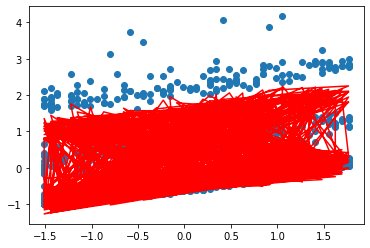

Streaming output truncated to the last 5000 lines.
[0.51553287]
[0.15093762]
[-0.60670224]
[-1.95605055]
[-1.43153456]
[-1.2799303]
[-0.82168935]
[-1.01770412]
[-0.87133893]
[-0.69297783]
[0.06056054]
[0.01560876]
[-0.13879124]
[-0.03024841]
[0.04323122]
[0.05473472]
[0.28739851]
[0.33354901]
[0.11230939]
[-0.06847892]
[0.13452762]
[-0.42337952]
[-0.2231614]
[0.51026551]
[1.28382383]
[0.65369517]
[0.6067031]
[-0.44086756]
[0.40412428]
[-0.15730284]
[-0.83542667]
[-0.33697309]
[-0.40809411]
[-0.21030793]
[0.07789809]
[-1.57503277]
[-1.64174234]
[-1.54524482]
[-1.2898522]
[-1.01636606]
[-0.84613517]
[-0.6844865]
[-0.52774107]
[-0.61246529]
[-0.39105919]
[-1.48761221]
[-1.6411604]
[-1.36907266]
[-1.53344857]
[-0.89779672]
[-0.84060871]
[-0.63397043]
[-0.72885072]
[-0.44615833]
[-0.44603321]
[-0.51354347]
[-0.58300469]
[-0.40307299]
[-0.62915441]
[0.21467601]
[1.06369859]
[0.9851859]
[1.19726389]
[1.4915087]
[1.74195847]
[2.56105617]
[2.80302624]
[3.43565067]
[2.74899476]
[2.07709156]
[1.5

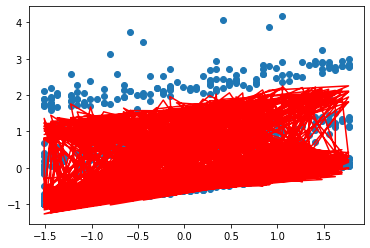

Streaming output truncated to the last 5000 lines.
[0.5315467]
[0.16649341]
[-0.59159649]
[-1.94145385]
[-1.41718894]
[-1.26582253]
[-0.80820642]
[-1.00488658]
[-0.85848679]
[-0.68078851]
[0.073577]
[0.02798391]
[-0.12703716]
[-0.01845286]
[0.05518328]
[0.06661796]
[0.29903082]
[0.34439022]
[0.12336359]
[-0.05734823]
[0.1456143]
[-0.41153289]
[-0.21209442]
[0.5225615]
[1.2974564]
[0.66824754]
[0.62160118]
[-0.426093]
[0.41996255]
[-0.14006827]
[-0.81840218]
[-0.3200761]
[-0.39165467]
[-0.19473634]
[0.09368469]
[-1.55948063]
[-1.62653213]
[-1.5303433]
[-1.27519496]
[-1.00198299]
[-0.83202027]
[-0.67062455]
[-0.5138773]
[-0.59895101]
[-0.37774555]
[-1.47509027]
[-1.6288955]
[-1.35725916]
[-1.52184693]
[-0.88636669]
[-0.82877031]
[-0.62230669]
[-0.71803053]
[-0.43516312]
[-0.43541421]
[-0.50317415]
[-0.57329791]
[-0.39399902]
[-0.62090167]
[0.22430834]
[1.07436888]
[0.99491146]
[1.2066872]
[1.50085001]
[1.75105407]
[2.57125022]
[2.81322437]
[3.447717]
[2.76255926]
[2.09212944]
[1.57661374

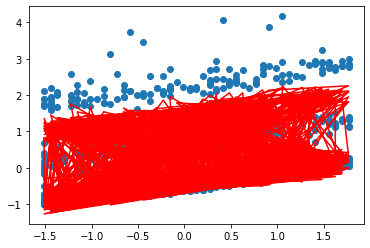

Streaming output truncated to the last 5000 lines.
[0.54680608]
[0.18131531]
[-0.57720136]
[-1.92754587]
[-1.4035242]
[-1.25238614]
[-0.79536745]
[-0.99267842]
[-0.84624393]
[-0.66917986]
[0.08597554]
[0.03977297]
[-0.11583778]
[-0.00721164]
[0.06657477]
[0.07794685]
[0.31011932]
[0.35472288]
[0.13390321]
[-0.04673241]
[0.15619044]
[-0.40023653]
[-0.20154239]
[0.53428793]
[1.31045754]
[0.68212245]
[0.63580736]
[-0.41200688]
[0.4350645]
[-0.12363759]
[-0.80217356]
[-0.3039685]
[-0.37598438]
[-0.17989516]
[0.10873222]
[-1.54465746]
[-1.61203037]
[-1.5161333]
[-1.26122102]
[-0.98826681]
[-0.81856112]
[-0.65740794]
[-0.50065719]
[-0.58606341]
[-0.36504935]
[-1.46314974]
[-1.61720312]
[-1.34599484]
[-1.51078238]
[-0.87546891]
[-0.81748023]
[-0.61118492]
[-0.70771394]
[-0.42467849]
[-0.42528528]
[-0.49328166]
[-0.56403912]
[-0.38534507]
[-0.61302923]
[0.23349772]
[1.08454963]
[1.0041879]
[1.21567929]
[1.50976534]
[1.75973337]
[2.58097664]
[2.82295175]
[3.45922741]
[2.77549444]
[2.10646568]
[

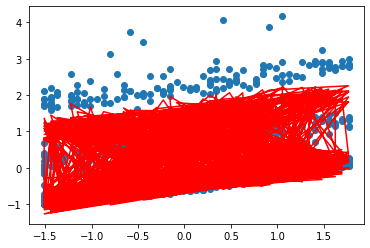

Streaming output truncated to the last 5000 lines.
[0.5613467]
[0.19543807]
[-0.5634833]
[-1.91429399]
[-1.39050789]
[-1.23958901]
[-0.78314153]
[-0.98105052]
[-0.83458131]
[-0.65812408]
[0.09778563]
[0.05100384]
[-0.10516683]
[0.00350139]
[0.07743206]
[0.08874734]
[0.32068951]
[0.3645709]
[0.14395224]
[-0.03660766]
[0.16627953]
[-0.38946486]
[-0.19148133]
[0.54547119]
[1.3228565]
[0.69535151]
[0.64935383]
[-0.39857708]
[0.44946439]
[-0.10797324]
[-0.78670354]
[-0.28861331]
[-0.36104717]
[-0.16575006]
[0.12307535]
[-1.530529]
[-1.59820404]
[-1.50258272]
[-1.24789849]
[-0.97518658]
[-0.80572723]
[-0.64480658]
[-0.48805082]
[-0.57377343]
[-0.35294195]
[-1.45176364]
[-1.60605652]
[-1.33525415]
[-1.50023006]
[-0.86507856]
[-0.80671304]
[-0.60057991]
[-0.69787753]
[-0.41468073]
[-0.4156238]
[-0.48384411]
[-0.55520767]
[-0.37709176]
[-0.60551965]
[0.24226443]
[1.09426317]
[1.01303587]
[1.22425975]
[1.51827401]
[1.7680153]
[2.59025677]
[2.83223004]
[3.47020741]
[2.78782945]
[2.12013301]
[1.60

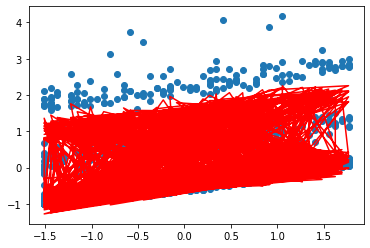

Streaming output truncated to the last 5000 lines.
[0.5752025]
[0.20889477]
[-0.55041035]
[-1.90166714]
[-1.37810906]
[-1.22740058]
[-0.7714992]
[-0.96997516]
[-0.82347131]
[-0.6475947]
[0.10903534]
[0.06170307]
[-0.09499927]
[0.01371114]
[0.08778028]
[0.09904411]
[0.33076567]
[0.3739571]
[0.15353354]
[-0.02695127]
[0.17590398]
[-0.37919348]
[-0.18188836]
[0.55613647]
[1.3346812]
[0.70796483]
[0.66227127]
[-0.38577294]
[0.4631949]
[-0.09303944]
[-0.77195659]
[-0.27397531]
[-0.34680867]
[-0.1522683]
[0.13674716]
[-1.51706261]
[-1.58502164]
[-1.48966094]
[-1.23519696]
[-0.96271279]
[-0.79348952]
[-0.63279179]
[-0.47602968]
[-0.56205335]
[-0.34139604]
[-1.4409062]
[-1.59543019]
[-1.32501273]
[-1.49016626]
[-0.85517197]
[-0.79644451]
[-0.59046762]
[-0.68849891]
[-0.4051472]
[-0.40640822]
[-0.47484063]
[-0.54678389]
[-0.36922056]
[-0.59835628]
[0.25062783]
[1.10353083]
[1.02147506]
[1.23244732]
[1.52639443]
[1.77591796]
[2.59911098]
[2.84107989]
[3.48068138]
[2.79959208]
[2.13316262]
[1.620

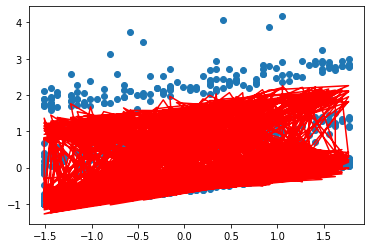

Streaming output truncated to the last 5000 lines.
[0.58840585]
[0.22171695]
[-0.53795206]
[-1.88963573]
[-1.36629829]
[-1.21579176]
[-0.76041245]
[-0.95942596]
[-0.8128876]
[-0.63756651]
[0.11975139]
[0.07189593]
[-0.08531125]
[0.02344135]
[0.0976434]
[0.10886073]
[0.34037095]
[0.38290317]
[0.16266891]
[-0.01774158]
[0.18508518]
[-0.36939913]
[-0.17274169]
[0.56630777]
[1.34595825]
[0.71999112]
[0.67458892]
[-0.37356528]
[0.47628718]
[-0.07880205]
[-0.75789886]
[-0.26002093]
[-0.33323614]
[-0.13941869]
[0.14977914]
[-1.50422719]
[-1.57245313]
[-1.47733875]
[-1.22308744]
[-0.95081728]
[-0.78182025]
[-0.62133625]
[-0.46456656]
[-0.55087676]
[-0.33038557]
[-1.43055287]
[-1.58529985]
[-1.31524736]
[-1.48056838]
[-0.84572661]
[-0.78665155]
[-0.58082514]
[-0.6795568]
[-0.39605635]
[-0.39761798]
[-0.46625126]
[-0.53874899]
[-0.36171382]
[-0.59152321]
[0.25860637]
[1.11237299]
[1.02952426]
[1.24025987]
[1.53414421]
[1.78345861]
[2.60755872]
[2.84952103]
[3.49067254]
[2.81080885]
[2.14558426]


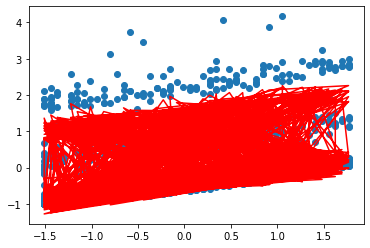

Streaming output truncated to the last 5000 lines.
[0.60098757]
[0.23393461]
[-0.52607942]
[-1.87817158]
[-1.35504756]
[-1.20473485]
[-0.74985462]
[-0.9493778]
[-0.80280515]
[-0.62801555]
[0.12995921]
[0.08160652]
[-0.07608007]
[0.0327146]
[0.10704423]
[0.11821963]
[0.34952741]
[0.39142983]
[0.17137911]
[-0.00895794]
[0.19384352]
[-0.36005966]
[-0.16402052]
[0.57600798]
[1.35671303]
[0.73145776]
[0.68633469]
[-0.36192626]
[0.48877092]
[-0.06522855]
[-0.74449806]
[-0.24671815]
[-0.32029837]
[-0.12717154]
[0.16220133]
[-1.49199312]
[-1.56046991]
[-1.46558831]
[-1.2115423]
[-0.93947322]
[-0.770693]
[-0.61041388]
[-0.45363554]
[-0.54021844]
[-0.3198857]
[-1.42068023]
[-1.57564232]
[-1.30593589]
[-1.47141486]
[-0.83672096]
[-0.77731211]
[-0.57163063]
[-0.67103085]
[-0.3873876]
[-0.38923345]
[-0.45805701]
[-0.53108506]
[-0.3545547]
[-0.58500529]
[0.26621771]
[1.12080907]
[1.03720141]
[1.24771447]
[1.54154016]
[1.79065375]
[2.61561856]
[2.85757225]
[3.50020309]
[2.82150504]
[2.15742628]
[1.64

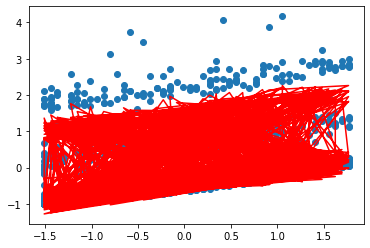

Streaming output truncated to the last 5000 lines.
[0.61297703]
[0.24557637]
[-0.51476481]
[-1.86724783]
[-1.34433017]
[-1.19420348]
[-0.73980034]
[-0.93980675]
[-0.79320009]
[-0.61891897]
[0.13968302]
[0.09085774]
[-0.06728411]
[0.04155245]
[0.11600451]
[0.1271422]
[0.35825608]
[0.39955678]
[0.17968397]
[-0.00058063]
[0.20219847]
[-0.3511539]
[-0.15570503]
[0.58525893]
[1.36696974]
[0.74239084]
[0.69753515]
[-0.35082934]
[0.50067445]
[-0.05228794]
[-0.73172346]
[-0.23403648]
[-0.3079656]
[-0.1154985]
[0.17404233]
[-1.48033215]
[-1.54904468]
[-1.45438307]
[-1.2005352]
[-0.92865503]
[-0.76008256]
[-0.59999983]
[-0.44321189]
[-0.53005437]
[-0.30987275]
[-1.41126596]
[-1.56643552]
[-1.29705721]
[-1.46268513]
[-0.82813452]
[-0.76840517]
[-0.56286326]
[-0.66290169]
[-0.37912134]
[-0.38123593]
[-0.45023971]
[-0.52377499]
[-0.34772711]
[-0.57878804]
[0.27347865]
[1.12885764]
[1.04452362]
[1.25482743]
[1.54859833]
[1.79751911]
[2.62330823]
[2.86525151]
[3.50929419]
[2.83170478]
[2.16871572]
[1

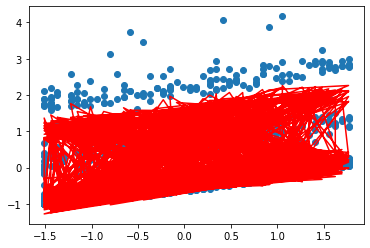

Streaming output truncated to the last 5000 lines.
[0.62440218]
[0.25666945]
[-0.5039819]
[-1.85683893]
[-1.33412073]
[-1.18417256]
[-0.73022545]
[-0.93069006]
[-0.78404971]
[-0.61025504]
[0.14894588]
[0.09967144]
[-0.05890276]
[0.0499754]
[0.12454495]
[0.13564885]
[0.36657699]
[0.40730282]
[0.18760237]
[0.00740912]
[0.21016858]
[-0.34266171]
[-0.14777635]
[0.59408145]
[1.37675145]
[0.75281523]
[0.70821567]
[-0.34024923]
[0.51202477]
[-0.03995065]
[-0.71954573]
[-0.22194686]
[-0.29620949]
[-0.10437262]
[0.1853294]
[-1.46921738]
[-1.53815142]
[-1.44369773]
[-1.19004103]
[-0.91833829]
[-0.7499649]
[-0.59007043]
[-0.43327205]
[-0.52036162]
[-0.30032411]
[-1.40228876]
[-1.55765839]
[-1.28859118]
[-1.45435958]
[-0.81994777]
[-0.75991069]
[-0.55450316]
[-0.65515086]
[-0.37123888]
[-0.37360756]
[-0.44278207]
[-0.51680248]
[-0.34121575]
[-0.57285763]
[0.28040528]
[1.13653642]
[1.05150724]
[1.26161431]
[1.55533407]
[1.80406973]
[2.63064465]
[2.87257593]
[3.51796603]
[2.84143108]
[2.17947835]
[1

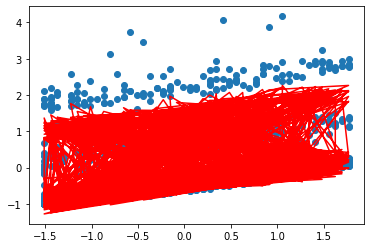

Streaming output truncated to the last 5000 lines.
[0.63528968]
[0.26723981]
[-0.49370561]
[-1.84692051]
[-1.32439504]
[-1.1746182]
[-0.72110696]
[-0.92200605]
[-0.77533239]
[-0.6020031]
[0.15776975]
[0.10806839]
[-0.0509164]
[0.058003]
[0.1326853]
[0.143759]
[0.37450923]
[0.41468585]
[0.1951523]
[0.01502926]
[0.21777157]
[-0.33456386]
[-0.14021644]
[0.6024954]
[1.38608019]
[0.76275465]
[0.71840041]
[-0.33016182]
[0.52284761]
[-0.02818851]
[-0.70793694]
[-0.21042158]
[-0.28500302]
[-0.09376818]
[0.19608852]
[-1.45862315]
[-1.52776534]
[-1.43350814]
[-1.18003585]
[-0.90849975]
[-0.7403171]
[-0.58060308]
[-0.42379352]
[-0.51111833]
[-0.29121825]
[-1.39372833]
[-1.54929087]
[-1.28051863]
[-1.44641949]
[-0.81214206]
[-0.75180956]
[-0.5465314]
[-0.64776073]
[-0.36372238]
[-0.36633132]
[-0.43566754]
[-0.51015198]
[-0.33500598]
[-0.5672009]
[0.2870129]
[1.14386231]
[1.05816784]
[1.26808998]
[1.561762]
[1.81031996]
[2.63764397]
[2.87956186]
[3.52623789]
[2.85070586]
[2.18973876]
[1.68172005]
[

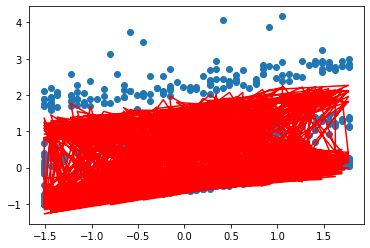

Streaming output truncated to the last 5000 lines.
[0.64566491]
[0.27731216]
[-0.48391206]
[-1.83746939]
[-1.31513008]
[-1.16551764]
[-0.71242301]
[-0.91373408]
[-0.76702754]
[-0.59414343]
[0.16617553]
[0.11606839]
[-0.04330635]
[0.06565386]
[0.14044435]
[0.15149117]
[0.38207101]
[0.42172293]
[0.20235095]
[0.02229687]
[0.22502434]
[-0.32684201]
[-0.13300814]
[0.6105197]
[1.39497695]
[0.7722317]
[0.72811242]
[-0.32054412]
[0.53316752]
[-0.01697467]
[-0.69687046]
[-0.19943424]
[-0.27432045]
[-0.08366067]
[0.20634445]
[-1.44852504]
[-1.51786279]
[-1.42379127]
[-1.17049684]
[-0.8991172]
[-0.73111732]
[-0.57157625]
[-0.41475488]
[-0.50230366]
[-0.28253464]
[-1.38556531]
[-1.54131383]
[-1.27282123]
[-1.43884703]
[-0.80469964]
[-0.74408356]
[-0.53892993]
[-0.64071451]
[-0.35655484]
[-0.35939095]
[-0.42888038]
[-0.50380863]
[-0.32908386]
[-0.56180526]
[0.29331616]
[1.15085146]
[1.06452031]
[1.27426863]
[1.56789612]
[1.8162835]
[2.64432161]
[2.88622488]
[3.53412817]
[2.85955006]
[2.19952036]
[1

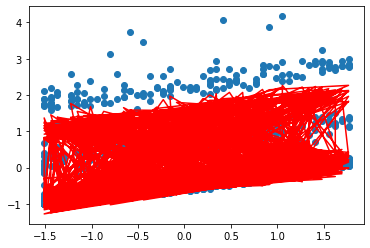

Streaming output truncated to the last 5000 lines.
[0.65555204]
[0.28691005]
[-0.4745785]
[-1.82846346]
[-1.30630391]
[-1.15684923]
[-0.70415276]
[-0.9058545]
[-0.75911554]
[-0.5866573]
[0.17418311]
[0.12369028]
[-0.03605481]
[0.07294574]
[0.14784003]
[0.15886303]
[0.38927967]
[0.42843032]
[0.20921466]
[0.02922825]
[0.23194301]
[-0.31947871]
[-0.12613508]
[0.61817242]
[1.40346173]
[0.78126793]
[0.73737368]
[-0.31137422]
[0.54300789]
[-0.00628353]
[-0.6863209]
[-0.18895967]
[-0.26413722]
[-0.07402676]
[0.2161208]
[-1.43889976]
[-1.50842124]
[-1.41452519]
[-1.16140226]
[-0.8901695]
[-0.72234473]
[-0.56296943]
[-0.40613569]
[-0.49389772]
[-0.27425367]
[-1.37778124]
[-1.53370903]
[-1.26548155]
[-1.43162518]
[-0.79760358]
[-0.7367153]
[-0.53168151]
[-0.63399619]
[-0.34972006]
[-0.35277096]
[-0.42240553]
[-0.49775828]
[-0.32343609]
[-0.55665871]
[0.29932903]
[1.15751927]
[1.07057883]
[1.28016379]
[1.57374978]
[1.82197343]
[2.65069229]
[2.89257988]
[3.5416544]
[2.86798364]
[2.20884549]
[1.702

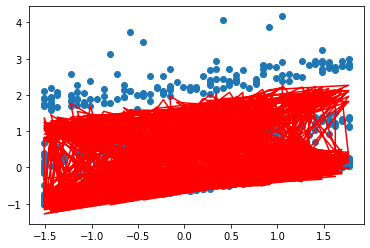

Streaming output truncated to the last 5000 lines.
[0.66497411]
[0.2960559]
[-0.46568323]
[-1.81988168]
[-1.29789566]
[-1.14859235]
[-0.69627641]
[-0.89834862]
[-0.75157772]
[-0.57952687]
[0.18181146]
[0.13095203]
[-0.02914482]
[0.07989553]
[0.15488941]
[0.1658914]
[0.39615174]
[0.4348235]
[0.21575905]
[0.03583896]
[0.23854295]
[-0.31245728]
[-0.11958164]
[0.62547077]
[1.41155363]
[0.78988388]
[0.74620514]
[-0.30263124]
[0.55239103]
[0.00390931]
[-0.67626408]
[-0.17897388]
[-0.25442995]
[-0.0648442]
[0.22544003]
[-1.42972511]
[-1.49941919]
[-1.40568897]
[-1.15273136]
[-0.88163647]
[-0.71397946]
[-0.55476303]
[-0.39791646]
[-0.48588157]
[-0.26635667]
[-1.37035852]
[-1.52645909]
[-1.25848294]
[-1.42473772]
[-0.79083774]
[-0.7296882]
[-0.52476976]
[-0.62759051]
[-0.34320257]
[-0.34645657]
[-0.41622865]
[-0.49198741]
[-0.31804998]
[-0.55174979]
[0.30506481]
[1.16388046]
[1.07635694]
[1.28578842]
[1.57933573]
[1.82740224]
[2.65677005]
[2.89864105]
[3.54883334]
[2.87602562]
[2.21773545]
[1.7

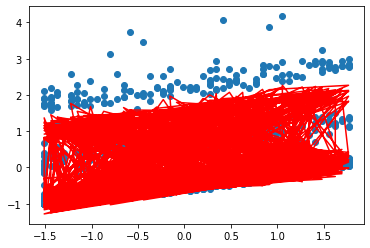

Streaming output truncated to the last 5000 lines.
[0.67395306]
[0.30477106]
[-0.45720561]
[-1.81170399]
[-1.28988545]
[-1.14072737]
[-0.68877509]
[-0.89119862]
[-0.74439631]
[-0.57273515]
[0.18907861]
[0.13787071]
[-0.02256024]
[0.08651933]
[0.16160875]
[0.17259232]
[0.40270298]
[0.44091724]
[0.22199898]
[0.04214384]
[0.24483886]
[-0.30576185]
[-0.11333295]
[0.63243118]
[1.41927086]
[0.79809914]
[0.75462677]
[-0.29429526]
[0.56133822]
[0.01362712]
[-0.66667695]
[-0.16945402]
[-0.24517636]
[-0.05609179]
[0.23432359]
[-1.42097995]
[-1.49083617]
[-1.39726264]
[-1.14446439]
[-0.87349886]
[-0.70600259]
[-0.54693841]
[-0.39007861]
[-0.47823712]
[-0.25882583]
[-1.36328036]
[-1.51954743]
[-1.25180954]
[-1.41816915]
[-0.78438673]
[-0.72298646]
[-0.518179]
[-0.6214829]
[-0.33698764]
[-0.34043368]
[-0.41033605]
[-0.48648314]
[-0.31291343]
[-0.54706757]
[0.31053624]
[1.16994905]
[1.08186758]
[1.29115485]
[1.58466613]
[1.83258186]
[2.6625683]
[2.90442193]
[3.55568097]
[2.88369418]
[2.22621053]
[1.

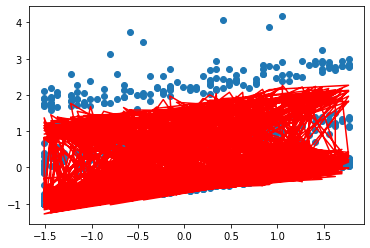

Streaming output truncated to the last 5000 lines.
[0.68250979]
[0.31307589]
[-0.44912596]
[-1.80391131]
[-1.28225435]
[-1.13323561]
[-0.68163085]
[-0.88438755]
[-0.73755438]
[-0.56626597]
[0.19600174]
[0.14446262]
[-0.01628568]
[0.09283249]
[0.16801357]
[0.17898109]
[0.40894839]
[0.44672559]
[0.22794864]
[0.04815702]
[0.25084471]
[-0.29937725]
[-0.10737481]
[0.63906931]
[1.42663078]
[0.80593239]
[0.76265763]
[-0.2863473]
[0.56986973]
[0.02289207]
[-0.65753751]
[-0.16037829]
[-0.23635519]
[-0.04774933]
[0.24279188]
[-1.41264413]
[-1.48265264]
[-1.38922717]
[-1.13658248]
[-0.86573833]
[-0.69839604]
[-0.53947778]
[-0.38260443]
[-0.47094714]
[-0.25164416]
[-1.35653076]
[-1.51295826]
[-1.24544623]
[-1.41190471]
[-0.77823588]
[-0.71659501]
[-0.51189432]
[-0.6156595]
[-0.3310612]
[-0.33468883]
[-0.40471465]
[-0.48123317]
[-0.30801488]
[-0.54260162]
[0.31575545]
[1.17573847]
[1.08712306]
[1.29627488]
[1.58975263]
[1.83752366]
[2.66809985]
[2.90993544]
[3.56221253]
[2.89100661]
[2.2342901]
[1.

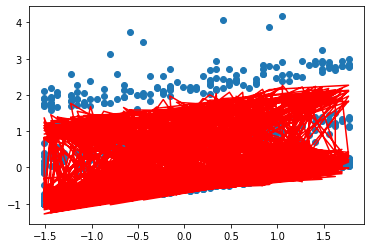

Streaming output truncated to the last 5000 lines.
[0.69066423]
[0.32098978]
[-0.44142554]
[-1.79648545]
[-1.27498433]
[-1.12609927]
[-0.67482659]
[-0.87789927]
[-0.7310358]
[-0.56010394]
[0.20259722]
[0.15074324]
[-0.01030649]
[0.09884963]
[0.17411862]
[0.18507228]
[0.4149023]
[0.45226196]
[0.23362155]
[0.05389201]
[0.25657386]
[-0.29328904]
[-0.10169371]
[0.64540008]
[1.43364993]
[0.8134014]
[0.77031587]
[-0.27876926]
[0.5780049]
[0.0317253]
[-0.64882484]
[-0.15172592]
[-0.22794619]
[-0.03979757]
[0.25086438]
[-1.40469844]
[-1.47484998]
[-1.38156442]
[-1.12906769]
[-0.8583374]
[-0.69114262]
[-0.53236418]
[-0.37547702]
[-0.46399518]
[-0.24479546]
[-1.35009445]
[-1.50667651]
[-1.23937858]
[-1.40593034]
[-0.7723712]
[-0.71049946]
[-0.50590149]
[-0.61010707]
[-0.32540987]
[-0.32920921]
[-0.39935199]
[-0.47622577]
[-0.30334334]
[-0.53834198]
[0.32073402]
[1.18126148]
[1.09213516]
[1.30115976]
[1.59460632]
[1.84223851]
[2.67337691]
[2.91519391]
[3.56844256]
[2.89797944]
[2.24199261]
[1.737

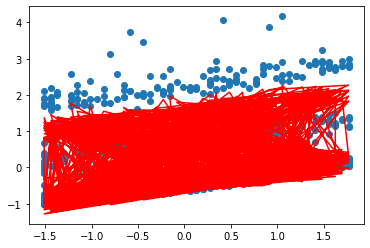

Streaming output truncated to the last 5000 lines.
[0.69691091]
[0.32705184]
[-0.4355262]
[-1.79079719]
[-1.26941674]
[-1.12063469]
[-0.66961701]
[-0.8729307]
[-0.72604341]
[-0.55538558]
[0.20764818]
[0.15555356]
[-0.0057264]
[0.10345958]
[0.17879631]
[0.18974033]
[0.41946472]
[0.45650383]
[0.2379693]
[0.05828836]
[0.26096655]
[-0.28862261]
[-0.0973396]
[0.650253]
[1.43903055]
[0.81912581]
[0.77618583]
[-0.27296157]
[0.58424009]
[0.03849462]
[-0.64214853]
[-0.14509552]
[-0.22150277]
[-0.03370512]
[0.2570499]
[-1.39861046]
[-1.46887013]
[-1.37569093]
[-1.12330865]
[-0.85266431]
[-0.68558307]
[-0.52691228]
[-0.37001392]
[-0.45866642]
[-0.23954583]
[-1.34516118]
[-1.50186279]
[-1.23472808]
[-1.40135064]
[-0.76787652]
[-0.70582684]
[-0.50130821]
[-0.60585173]
[-0.32107826]
[-0.32500822]
[-0.39524015]
[-0.47238697]
[-0.29976247]
[-0.53507643]
[0.32455106]
[1.1854963]
[1.09597717]
[1.3049056]
[1.59832879]
[1.84585398]
[2.67742317]
[2.91922498]
[3.57321884]
[2.9033238]
[2.24789497]
[1.7442656

ValueError: ignored

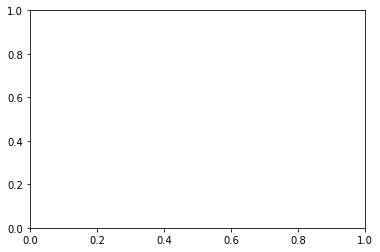

In [32]:
#theta_array = training(age_value,bmi_value,children_value,smoker_value,sex_value,region_value,charges_value,0.01,500)
theta_array = training(X_norm[:,0:1],X_norm[:,1:2],X_norm[:,2:3],X_norm[:,3:4],X_norm[:,4:5],X_norm[:,5:6],X_norm[:,6:7],0.01,500)